<a href="https://colab.research.google.com/github/Reactodactyl/MovLensDataSet/blob/main/Recommender_Systems_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data

<h2> Name </h2>
410821322 Steven Jonathan
410821329 Jose Rendy
410821334 Yohanna Astrid
410821335 Danay Ferguson

<h2>Project Setup</h2>

In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

#Remove warnings
import warnings
warnings.filterwarnings("ignore") 

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import pandas as pd
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "recommender_sys_proj"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

<h2>Loading The Data</h2>


![picture](https://drive.google.com/uc?export=view&id=1gIHAyThFFxwKwLl4kFTVeoE51Ig4pcTx)

In [2]:
# load the movie rating data into a dataframe
rating_header = ["user_id", "item_id", "rating", "timestamp"]
rating = pd.read_csv("ml-100k/u.data", sep = '\t', header = None, names=rating_header).drop("timestamp",axis=1)

In [3]:
rating.head()

,user_id,item_id,rating
0,196,242,3
1,186,302,3
2,22,377,1
3,244,51,2
4,166,346,1


In [4]:
rating.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   user_id  100000 non-null  int64
 1   item_id  100000 non-null  int64
 2   rating   100000 non-null  int64
dtypes: int64(3)
memory usage: 2.3 MB


In [5]:
user_header = ["user_id", "age", "gender", "occupation", "zip_code"]
users = pd.read_csv("ml-100k/u.user", sep = '|', header = None, names=user_header)

In [6]:
users.head()

,user_id,age,gender,occupation,zip_code
0,1,24,M,technician,85711
1,2,53,F,other,94043
2,3,23,M,writer,32067
3,4,24,M,technician,43537
4,5,33,F,other,15213


In [7]:
users.loc[users['zip_code'] == 'T8H1N']

,user_id,age,gender,occupation,zip_code
73,74,39,M,scientist,T8H1N
633,634,39,M,engineer,T8H1N


In [8]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 943 entries, 0 to 942
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   user_id     943 non-null    int64 
 1   age         943 non-null    int64 
 2   gender      943 non-null    object
 3   occupation  943 non-null    object
 4   zip_code    943 non-null    object
dtypes: int64(2), object(3)
memory usage: 37.0+ KB


In [9]:
# load movie data into a dataframe
movie_header = ["item_id", "title", "release_date", "video_release_date", "IMDb_URL",
         "unknown", "Action", "Adventure", "Animation","Children's", "Comedy", "Crime",
         "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror", "Musical", "Mystery", 
         "Romance", "Sci-Fi", "Thriller", "War", "Western"]
movies = pd.read_csv("ml-100k/u.item", sep = '|', header = None, encoding = 'latin1', names = movie_header)

In [10]:
movies['release_date'] = movies['release_date'].map(
        lambda x: x[-4:] if type(x) == str else x)
movies = movies.drop(columns=['video_release_date', "IMDb_URL"])
movies = movies.rename(columns={"release_date": "year"})
movies["year"] = pd.to_numeric(movies["year"])
movies["year_category"] = pd.cut(movies["year"], bins=[0, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000], labels=[0, 1, 2, 3, 4, 5, 6, 7])
movies.head()

,item_id,title,year,unknown,Action,Adventure,Animation,Children's,Comedy,Crime,...,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,year_category
0,1,Toy Story (1995),1995.0,0,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,7
1,2,GoldenEye (1995),1995.0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,7
2,3,Four Rooms (1995),1995.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,7
3,4,Get Shorty (1995),1995.0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,7
4,5,Copycat (1995),1995.0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,7


In [11]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1682 entries, 0 to 1681
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   item_id        1682 non-null   int64   
 1   title          1682 non-null   object  
 2   year           1681 non-null   float64 
 3   unknown        1682 non-null   int64   
 4   Action         1682 non-null   int64   
 5   Adventure      1682 non-null   int64   
 6   Animation      1682 non-null   int64   
 7   Children's     1682 non-null   int64   
 8   Comedy         1682 non-null   int64   
 9   Crime          1682 non-null   int64   
 10  Documentary    1682 non-null   int64   
 11  Drama          1682 non-null   int64   
 12  Fantasy        1682 non-null   int64   
 13  Film-Noir      1682 non-null   int64   
 14  Horror         1682 non-null   int64   
 15  Musical        1682 non-null   int64   
 16  Mystery        1682 non-null   int64   
 17  Romance        1682 non-null   in

<h2>Data Transformation & Combination</h2>

In [12]:
users_num = users.copy()
users_num["gender"].replace(['F', 'M'],[0, 1], inplace=True) # replace F and M with 0 and 1, respectively
saveusernum = users_num["gender"].replace(['F', 'M'],[0, 1], inplace=True) # replace F and M with 0 and 1, respectively

In [13]:
occupation = pd.read_csv("ml-100k/u.occupation", header = None)
occupation_list = occupation.values
saveuseroccup = users_num["occupation"]
users_num["occupation"].replace(occupation_list,list(range(0, len(occupation_list))), inplace=True)
users_num.head()

,user_id,age,gender,occupation,zip_code
0,1,24,1,19,85711
1,2,53,0,13,94043
2,3,23,1,20,32067
3,4,24,1,19,43537
4,5,33,0,13,15213


In [14]:
# data aggregation
average_rating = rating[["item_id", "rating"]].groupby("item_id", as_index=False).mean()  # average rating per movie
average_rating.sort_values("rating",ascending=False).head()

,item_id,rating
813,814,5.0
1598,1599,5.0
1200,1201,5.0
1121,1122,5.0
1652,1653,5.0


In [15]:
# merge two dataframes (average_rating and movies)
average_rating_tab = pd.merge(average_rating, movies[["item_id", "title"]])

<h2>Preprocessing</h2>

In [16]:
import preprocessingFuncts as pp
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

<h3>Reading the ratings data</h3>
Returns a pandas data frame with cleaned data from u.data

In [17]:
ratings = pp.readRatingData()
ratings = ratings.sort_values(by=['user_id','item_id']).reset_index().drop('index',axis=1)
ratings

,user_id,item_id,rating
0,1,1,5
1,1,2,3
2,1,3,4
3,1,4,3
4,1,5,3
...,...,...,...
99995,943,1067,2
99996,943,1074,4
99997,943,1188,3
99998,943,1228,3


<h3>Reading the item data</h3>
Returns a pandas data frame with cleaned data from u.item (no title, sry, thought it's not important)

In [18]:
items = pp.readItemData()
items = items.sort_values(by=['year','item_id']).reset_index().drop('index',axis=1)
items = items.dropna()

<h3>Reading the user data</h3>
Returns a pandas data frame with cleaned data from u.user. Occupation and gender column's contents are now nominal.

In [19]:
users = pp.readUserData()
users = users.sort_values(by=['user_id','age']).reset_index().drop('index',axis=1)
users

,user_id,age,gender,occupation,zip_code,age_category
0,1,24,1,19,85711,2
1,2,53,0,13,94043,5
2,3,23,1,20,32067,2
3,4,24,1,19,43537,2
4,5,33,0,13,15213,3
...,...,...,...,...,...,...
938,939,26,0,18,33319,2
939,940,32,1,0,02215,3
940,941,20,1,18,97229,1
941,942,48,0,10,78209,4


In [20]:
pp.specifyByUserData(users,ratings,['gender','occupation','age'])

,user_id,gender,occupation,age,item_id,rating
0,1,1,19,24,1,5
1,1,1,19,24,2,3
2,1,1,19,24,3,4
3,1,1,19,24,4,3
4,1,1,19,24,5,3
...,...,...,...,...,...,...
99995,943,1,18,22,1067,2
99996,943,1,18,22,1074,4
99997,943,1,18,22,1188,3
99998,943,1,18,22,1228,3


# Data Analysis

<h2>Analyze The Data</h2>

<h3> Start of teacher's code </h3>
-----------------------------------

array([[<AxesSubplot:title={'center':'age'}>]], dtype=object)

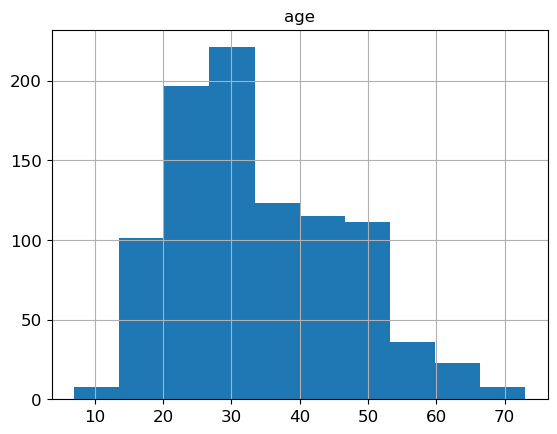

In [21]:
# age intervals distrubution
users.hist(column="age")
#users["age_category"] = pd.cut(users["age"], bins = [0, 10, 20, 30, 40, 50, 60, 70, 80], labels=[5, 15, 25, 35, 45, 55, 65, 75])
#users["age_category"].hist()

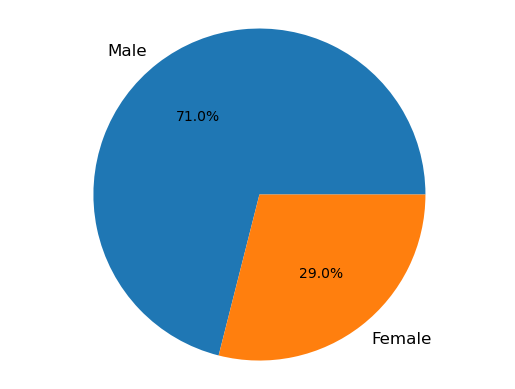

In [22]:
#Data by Gender
temp = users.groupby('gender')
plt.pie([temp.get_group(1).size,temp.get_group(0).size],labels=["Male","Female"],autopct='%1.1f%%')
plt.axis("equal")
plt.show()

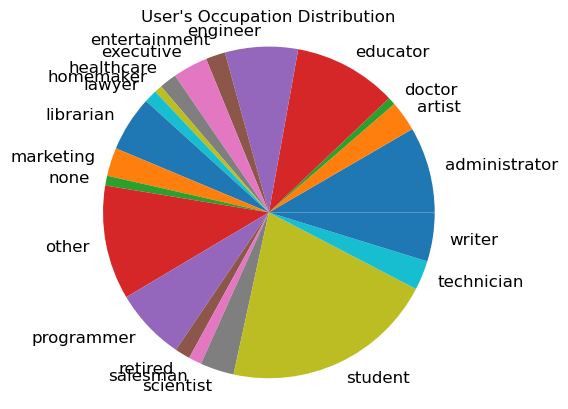

In [23]:
# occupation distrubution
occupation_count = users[["user_id", "occupation"]].groupby("occupation", as_index=False).size()  # count the numbers

plt.pie(occupation_count["size"], labels=[x[0] for x in pp.getOccupationList().values])
plt.title("User's Occupation Distribution")
plt.axis("equal")
plt.show()

<h3>End of teacher's code</h3>
--------------------------------------

In [24]:
import preprocessingFuncts as pp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn.metrics as metrics

<h3>Best and Worst User Data</h3>

<h4> User </h4> 

<h5> Unweighted User Data </h5>

<h6>Unweighted User Data - Gender</h6>

In [25]:
b = pp.Unthresholduserdata("gender")
for n in b:
    display(n)

       user_id  item_id  rating  average_rating
99960       60     1122       5             5.0
99791      437     1599       5             5.0
99961       90     1201       5             5.0
96399       13      814       5             5.0
99243      146     1293       5             5.0
...        ...      ...     ...             ...
98403      405     1582       1             1.0
99506      405     1579       1             1.0
87872      181     1320       1             1.0
99928      279     1494       1             1.0
99426      405     1587       1             1.0

[100000 rows x 4 columns]


,item_id,title
average_rating,,
5.000000,1599,Someone Else's America (1995)
4.500000,1642,Some Mother's Son (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Catwalk (1995)


,item_id,title
average_rating,,
5.000000,1653,They Made Me a Criminal (1939)
4.625000,1449,Pather Panchali (1955)
4.500000,1594,Maya Lin: A Strong Clear Vision (1994)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Catwalk (1995)


<h6>Unweighted User Data - Occupation</h6>

In [26]:
b = pp.Unthresholduserdata("occupation")
for n in b:
    display(n)

       user_id  item_id  rating  average_rating
99960       60     1122       5             5.0
99791      437     1599       5             5.0
99961       90     1201       5             5.0
96399       13      814       5             5.0
99243      146     1293       5             5.0
...        ...      ...     ...             ...
98403      405     1582       1             1.0
99506      405     1579       1             1.0
87872      181     1320       1             1.0
99928      279     1494       1             1.0
99426      405     1587       1             1.0

[100000 rows x 4 columns]


,item_id,title
average_rating,,
5.000000,1189,Prefontaine (1997)
4.625000,1449,Pather Panchali (1955)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.000000,599,Gordy (1995)
1.315789,424,Children of the Corn: The Gathering (1996)
1.500000,1360,"Machine, The (1994)"
1.615385,669,Body Parts (1991)
1.642857,440,Amityville II: The Possession (1982)


,item_id,title
average_rating,,
5.000000,1293,Star Kid (1997)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)


,item_id,title
average_rating,,
1.500000,1644,Sudden Manhattan (1996)
1.666667,1292,B*A*P*S (1997)
1.740741,457,Free Willy 3: The Rescue (1997)
1.750000,1257,"Designated Mourner, The (1997)"
1.800000,247,Turbo: A Power Rangers Movie (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
2.000000,1214,In the Realm of the Senses (Ai no corrida) (1976)
2.157895,263,Steel (1997)
2.219512,577,Coneheads (1993)
2.238806,120,Striptease (1996)


,item_id,title
average_rating,,
5.000000,1201,Marlene Dietrich: Shadow and Light (1996)
4.625000,1449,Pather Panchali (1955)
4.500000,119,Maya Lin: A Strong Clear Vision (1994)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.315789,424,Children of the Corn: The Gathering (1996)
1.500000,897,Time Tracers (1995)


,item_id,title
average_rating,,
4.625000,1449,Pather Panchali (1955)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1420,Gilligan's Island: The Movie (1998)
1.400000,104,Theodore Rex (1995)
1.600000,1162,Phat Beach (1996)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.333333,1287,Ed (1996)
1.500000,1290,Country Life (1994)
1.666667,1292,"Simple Wish, A (1997)"
1.700000,1087,Bloodsport 2 (1995)
1.714286,758,Lawnmower Man 2: Beyond Cyberspace (1996)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.445230,64,"Shawshank Redemption, The (1994)"


,item_id,title
average_rating,,
1.000000,1320,August (1996)
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Catwalk (1995)
1.400000,104,Theodore Rex (1995)
1.500000,1350,Crows and Sparrows (1949)


,item_id,title
average_rating,,
5.000000,1122,They Made Me a Criminal (1939)
4.500000,1642,Some Mother's Son (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.000000,437,Amityville 1992: It's About Time (1992)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.333333,1318,Catwalk (1995)
1.500000,1250,Best of the Best 3: No Turning Back (1995)


,item_id,title
average_rating,,
4.358491,50,Star Wars (1977)
4.291667,357,One Flew Over the Cuckoo's Nest (1975)
4.289744,98,"Silence of the Lambs, The (1991)"
4.283293,127,"Godfather, The (1972)"
4.262626,272,Good Will Hunting (1997)


,item_id,title
average_rating,,
1.740741,457,Free Willy 3: The Rescue (1997)
1.750000,981,Dangerous Ground (1997)
2.115385,352,Spice World (1997)
2.157895,931,"Island of Dr. Moreau, The (1996)"
2.188406,687,McHale's Navy (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.445230,64,"Shawshank Redemption, The (1994)"


,item_id,title
average_rating,,
1.333333,1420,Gilligan's Island: The Movie (1998)
1.571429,1246,Bushwhacked (1995)
1.800000,1272,Talking About Sex (1994)
1.840909,688,Leave It to Beaver (1997)
1.894737,894,Home Alone 3 (1997)


,item_id,title
average_rating,,
4.625000,1449,Pather Panchali (1955)
4.500000,1642,Some Mother's Son (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.000000,437,Amityville 1992: It's About Time (1992)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.333333,1318,Catwalk (1995)
1.642857,440,Amityville II: The Possession (1982)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.500000,1350,Crows and Sparrows (1949)
1.800000,1272,Talking About Sex (1994)
1.840909,688,Leave It to Beaver (1997)
1.857143,1177,Dunston Checks In (1996)
1.866667,103,All Dogs Go to Heaven 2 (1996)


,item_id,title
average_rating,,
4.466443,318,Schindler's List (1993)
4.445230,64,"Shawshank Redemption, The (1994)"
4.387560,603,Rear Window (1954)
4.385768,12,"Usual Suspects, The (1995)"
4.358491,50,Star Wars (1977)


,item_id,title
average_rating,,
1.571429,1246,Bushwhacked (1995)
1.615385,669,Body Parts (1991)
1.666667,1652,Temptress Moon (Feng Yue) (1996)
1.727273,1274,Robocop 3 (1993)
1.894737,894,Home Alone 3 (1997)


,item_id,title
average_rating,,
5.000000,1653,Star Kid (1997)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Ed (1996)


,item_id,title
average_rating,,
5.000000,1500,Santa with Muscles (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)


,item_id,title
average_rating,,
1.000000,1408,Butterfly Kiss (1995)
1.315789,424,Children of the Corn: The Gathering (1996)
1.500000,1250,Best of the Best 3: No Turning Back (1995)
1.600000,1162,Getting Even with Dad (1994)
1.666667,1412,Land Before Time III: The Time of the Great Giving (1995) (V)


,item_id,title
average_rating,,
4.625000,1449,Pather Panchali (1955)
4.500000,119,Maya Lin: A Strong Clear Vision (1994)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.740741,457,Free Willy 3: The Rescue (1997)
1.894737,894,Home Alone 3 (1997)
1.953488,890,Mortal Kombat: Annihilation (1997)
2.000000,1453,Angel on My Shoulder (1946)
2.131579,1089,Speed 2: Cruise Control (1997)


,item_id,title
average_rating,,
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)
4.445230,64,"Shawshank Redemption, The (1994)"


,item_id,title
average_rating,,
1.666667,788,Relative Fear (1994)
1.714286,758,Lawnmower Man 2: Beyond Cyberspace (1996)
1.740741,457,Free Willy 3: The Rescue (1997)
1.833333,1230,Ready to Wear (Pret-A-Porter) (1994)
1.840909,688,Leave It to Beaver (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.615385,669,Body Parts (1991)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.956522,375,Showgirls (1995)
2.000000,1414,Coldblooded (1995)


,item_id,title
average_rating,,
5.000000,1500,Santa with Muscles (1996)
4.500000,1594,Everest (1998)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.250000,777,Castle Freak (1995)
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Ed (1996)
1.400000,104,Theodore Rex (1995)


,item_id,title
average_rating,,
5.000000,1467,"Saint of Fort Washington, The (1993)"
4.500000,119,Maya Lin: A Strong Clear Vision (1994)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.333333,1420,Gilligan's Island: The Movie (1998)
1.400000,104,Theodore Rex (1995)
1.800000,247,Turbo: A Power Rangers Movie (1997)
1.818182,1254,Gone Fishin' (1997)
1.833333,976,Ready to Wear (Pret-A-Porter) (1994)


,item_id,title
average_rating,,
5.000000,1536,Aiqing wansui (1994)
4.625000,1449,Pather Panchali (1955)
4.500000,1398,Anna (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)


,item_id,title
average_rating,,
1.000000,437,Amityville 1992: It's About Time (1992)
1.166667,438,Amityville 3-D (1983)
1.250000,777,Castle Freak (1995)
1.315789,424,Children of the Corn: The Gathering (1996)
1.600000,1509,Getting Even with Dad (1994)


<h6>Unweighted User Data - Age Group</h6>

In [27]:
b = pp.Unthresholduserdata("age_group")
for n in b:
    display(n)

       user_id  item_id  rating  average_rating
99960       60     1122       5             5.0
99791      437     1599       5             5.0
99961       90     1201       5             5.0
96399       13      814       5             5.0
99243      146     1293       5             5.0
...        ...      ...     ...             ...
98403      405     1582       1             1.0
99506      405     1579       1             1.0
87872      181     1320       1             1.0
99928      279     1494       1             1.0
99426      405     1587       1             1.0

[100000 rows x 4 columns]


,item_id,title
average_rating,,
4.358491,50,Star Wars (1977)
4.252381,174,Raiders of the Lost Ark (1981)
4.245714,313,Titanic (1997)
4.204360,172,"Empire Strikes Back, The (1980)"
4.127660,1007,Waiting for Guffman (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
2.289474,1013,Anaconda (1997)
2.408163,683,Rocket Man (1997)
2.477273,539,Mouse Hunt (1997)
2.515152,878,That Darn Cat! (1997)


,item_id,title
average_rating,,
5.000000,1500,Santa with Muscles (1996)
4.500000,1594,Everest (1998)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.250000,777,Castle Freak (1995)
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Ed (1996)
1.500000,1250,Best of the Best 3: No Turning Back (1995)


,item_id,title
average_rating,,
5.000000,1599,Star Kid (1997)
4.625000,1449,Pather Panchali (1955)
4.500000,1398,Maya Lin: A Strong Clear Vision (1994)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)


,item_id,title
average_rating,,
1.000000,437,Amityville 1992: It's About Time (1992)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Catwalk (1995)


,item_id,title
average_rating,,
5.000000,1653,Santa with Muscles (1996)
4.625000,1449,Pather Panchali (1955)
4.500000,1398,Anna (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.315789,424,Children of the Corn: The Gathering (1996)
1.333333,1287,Ed (1996)


,item_id,title
average_rating,,
5.000000,1293,They Made Me a Criminal (1939)
4.625000,1449,Pather Panchali (1955)
4.500000,1642,Some Mother's Son (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.166667,438,Amityville 3-D (1983)
1.250000,442,"Amityville Curse, The (1990)"
1.315789,424,Children of the Corn: The Gathering (1996)
1.400000,104,Theodore Rex (1995)


,item_id,title
average_rating,,
5.000000,1293,Star Kid (1997)
4.625000,1449,Pather Panchali (1955)
4.500000,1642,Some Mother's Son (1996)
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)


,item_id,title
average_rating,,
1.000000,314,3 Ninjas: High Noon At Mega Mountain (1998)
1.333333,1420,Gilligan's Island: The Movie (1998)
1.500000,897,Time Tracers (1995)
1.615385,669,Body Parts (1991)
1.642857,440,Amityville II: The Possession (1982)


,item_id,title
average_rating,,
4.625000,1449,Pather Panchali (1955)
4.466443,318,Schindler's List (1993)
4.456790,483,Casablanca (1942)
4.445230,64,"Shawshank Redemption, The (1994)"
4.385768,12,"Usual Suspects, The (1995)"


,item_id,title
average_rating,,
1.740741,457,Free Willy 3: The Rescue (1997)
1.750000,1319,"Neon Bible, The (1995)"
1.840909,688,Leave It to Beaver (1997)
1.894737,894,Home Alone 3 (1997)
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.466443,318,Schindler's List (1993)
4.358491,50,Star Wars (1977)
4.292237,427,To Kill a Mockingbird (1962)
4.289744,98,"Silence of the Lambs, The (1991)"
4.251397,479,Vertigo (1958)


,item_id,title
average_rating,,
2.131579,1089,Speed 2: Cruise Control (1997)
2.808219,678,Volcano (1997)
2.943038,252,"Lost World: Jurassic Park, The (1997)"
3.000000,780,Dumb & Dumber (1994)
3.087156,322,Murder at 1600 (1997)


<h5>Weighted User Data</h5>

<h6> Weighted User Data - Gender </h6>

In [28]:
a = pp.Thresholduserdata(30,"gender")
for i in a:
    display(i)


       user_id  item_id  rating  average_rating  count
28164       14      408       5        4.491071    112
28217      864      408       5        4.491071    112
28204       70      408       4        4.491071    112
28203      637      408       5        4.491071    112
28202      363      408       5        4.491071    112
...        ...      ...     ...             ...    ...
29141      181      688       1        1.840909     44
29142       30      688       3        1.840909     44
29154      587      688       3        1.840909     44
29155      296      688       1        1.840909     44
29153       13      688       1        1.840909     44

[91726 rows x 5 columns]


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


<h6>Weighted User Data - Occupation</h6>

In [29]:
a = pp.Thresholduserdata(30,"occupation")
for i in a:
    display(i)

       user_id  item_id  rating  average_rating  count
28164       14      408       5        4.491071    112
28217      864      408       5        4.491071    112
28204       70      408       4        4.491071    112
28203      637      408       5        4.491071    112
28202      363      408       5        4.491071    112
...        ...      ...     ...             ...    ...
29141      181      688       1        1.840909     44
29142       30      688       3        1.840909     44
29154      587      688       3        1.840909     44
29155      296      688       1        1.840909     44
29153       13      688       1        1.840909     44

[91726 rows x 5 columns]


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.953488,890,Mortal Kombat: Annihilation (1997)
2.064516,383,"Flintstones, The (1994)"
2.131579,1089,Speed 2: Cruise Control (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)
2.131579,1089,Speed 2: Cruise Control (1997)
2.157895,931,"Island of Dr. Moreau, The (1996)"


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
2.219512,577,Coneheads (1993)
2.238806,120,Striptease (1996)
2.538462,877,Excess Baggage (1997)
2.546875,325,Crash (1996)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)
2.064516,383,"Flintstones, The (1994)"


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.445230,64,"Shawshank Redemption, The (1994)"


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
2.157895,931,"Island of Dr. Moreau, The (1996)"


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.445230,64,"Shawshank Redemption, The (1994)"


,item_id,title
average_rating,,
1.948718,743,"Crow: City of Angels, The (1996)"
2.064516,383,"Flintstones, The (1994)"
2.131579,1089,Speed 2: Cruise Control (1997)
2.188406,687,McHale's Navy (1997)
2.219512,577,Coneheads (1993)


,item_id,title
average_rating,,
4.358491,50,Star Wars (1977)
4.291667,357,One Flew Over the Cuckoo's Nest (1975)
4.289744,98,"Silence of the Lambs, The (1991)"
4.283293,127,"Godfather, The (1972)"
4.262626,272,Good Will Hunting (1997)


,item_id,title
average_rating,,
2.157895,931,"Island of Dr. Moreau, The (1996)"
2.188406,687,McHale's Navy (1997)
2.244444,1079,Joe's Apartment (1996)
2.339623,122,"Cable Guy, The (1996)"
2.397849,412,"Very Brady Sequel, A (1996)"


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.445230,64,"Shawshank Redemption, The (1994)"


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
2.064516,383,"Flintstones, The (1994)"
2.131579,1089,Speed 2: Cruise Control (1997)
2.166667,948,Booty Call (1997)
2.188406,687,McHale's Navy (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.903226,368,Bio-Dome (1996)
2.064516,383,"Flintstones, The (1994)"
2.157895,931,"Island of Dr. Moreau, The (1996)"
2.188406,687,McHale's Navy (1997)
2.219512,577,Coneheads (1993)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.933333,1215,Barb Wire (1996)
2.131579,1089,Speed 2: Cruise Control (1997)
2.166667,948,Booty Call (1997)
2.188406,687,McHale's Navy (1997)


,item_id,title
average_rating,,
4.466443,318,Schindler's List (1993)
4.445230,64,"Shawshank Redemption, The (1994)"
4.387560,603,Rear Window (1954)
4.385768,12,"Usual Suspects, The (1995)"
4.358491,50,Star Wars (1977)


,item_id,title
average_rating,,
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)
2.064516,383,"Flintstones, The (1994)"


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.953488,890,Mortal Kombat: Annihilation (1997)
2.131579,1089,Speed 2: Cruise Control (1997)
2.238806,120,Striptease (1996)
2.313953,988,"Beautician and the Beast, The (1997)"
2.339623,122,"Cable Guy, The (1996)"


,item_id,title
average_rating,,
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)
4.445230,64,"Shawshank Redemption, The (1994)"


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.953488,890,Mortal Kombat: Annihilation (1997)
2.064516,383,"Flintstones, The (1994)"
2.157895,931,"Island of Dr. Moreau, The (1996)"


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
2.131579,1089,Speed 2: Cruise Control (1997)
2.166667,948,Booty Call (1997)
2.289474,1013,Anaconda (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.953488,890,Mortal Kombat: Annihilation (1997)
2.064516,383,"Flintstones, The (1994)"
2.131579,1089,Speed 2: Cruise Control (1997)
2.157895,931,"Island of Dr. Moreau, The (1996)"


<h6>Weighted User Data - Age Group</h6>

In [30]:
a = pp.Thresholduserdata(30,"age_group")
for i in a:
    display(i)

       user_id  item_id  rating  average_rating  count
28164       14      408       5        4.491071    112
28217      864      408       5        4.491071    112
28204       70      408       4        4.491071    112
28203      637      408       5        4.491071    112
28202      363      408       5        4.491071    112
...        ...      ...     ...             ...    ...
29141      181      688       1        1.840909     44
29142       30      688       3        1.840909     44
29154      587      688       3        1.840909     44
29155      296      688       1        1.840909     44
29153       13      688       1        1.840909     44

[91726 rows x 5 columns]


,item_id,title
average_rating,,
4.358491,50,Star Wars (1977)
4.252381,174,Raiders of the Lost Ark (1981)
4.245714,313,Titanic (1997)
4.204360,172,"Empire Strikes Back, The (1980)"
4.127660,1007,Waiting for Guffman (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
2.289474,1013,Anaconda (1997)
2.408163,683,Rocket Man (1997)
2.477273,539,Mouse Hunt (1997)
2.515152,878,That Darn Cat! (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)


,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466443,318,Schindler's List (1993)
4.466102,169,"Wrong Trousers, The (1993)"
4.456790,483,Casablanca (1942)
4.447761,114,Wallace & Gromit: The Best of Aardman Animation (1996)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
1.933333,1215,Barb Wire (1996)
1.953488,890,Mortal Kombat: Annihilation (1997)
2.064516,383,"Flintstones, The (1994)"


,item_id,title
average_rating,,
4.466443,318,Schindler's List (1993)
4.456790,483,Casablanca (1942)
4.445230,64,"Shawshank Redemption, The (1994)"
4.385768,12,"Usual Suspects, The (1995)"
4.358491,50,Star Wars (1977)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.953488,890,Mortal Kombat: Annihilation (1997)
2.166667,948,Booty Call (1997)
2.188406,687,McHale's Navy (1997)
2.238806,120,Striptease (1996)


,item_id,title
average_rating,,
4.466443,318,Schindler's List (1993)
4.358491,50,Star Wars (1977)
4.292237,427,To Kill a Mockingbird (1962)
4.289744,98,"Silence of the Lambs, The (1991)"
4.251397,479,Vertigo (1958)


,item_id,title
average_rating,,
2.131579,1089,Speed 2: Cruise Control (1997)
2.808219,678,Volcano (1997)
2.943038,252,"Lost World: Jurassic Park, The (1997)"
3.000000,780,Dumb & Dumber (1994)
3.087156,322,Murder at 1600 (1997)


<h4> Item </h4>

<h5>Unweighted Item Data</h5>

<h6> Unweighted Item Data - Action </h6>

In [31]:
d = pp.Unthresholditemdata("Action")
for y in d:
    display(y)

,item_id,title
average_rating,,
4.358491,50,Star Wars (1977)
4.283293,127,"Godfather, The (1972)"
4.252381,174,Raiders of the Lost Ark (1981)
4.245714,313,Titanic (1997)
4.204360,172,"Empire Strikes Back, The (1980)"


,item_id,title
average_rating,,
1.000000,1618,The Courtyard (1995)
1.500000,1365,Time Tracers (1995)
1.700000,1087,Bloodsport 2 (1995)
1.800000,247,Turbo: A Power Rangers Movie (1997)
1.833333,976,Solo (1996)


<h6> Unweighted Item Data - Comedy </h6>

In [32]:
d = pp.Unthresholditemdata("Comedy")
for y in d:
    display(y)

,item_id,title
average_rating,,
5.000000,1500,Santa with Muscles (1996)
4.491071,408,"Close Shave, A (1995)"
4.466102,169,"Wrong Trousers, The (1993)"
4.284916,480,North by Northwest (1959)
4.260870,251,Shall We Dance? (1996)


,item_id,title
average_rating,,
1.000000,1659,Yankee Zulu (1994)
1.333333,1420,Gilligan's Island: The Movie (1998)
1.400000,104,Theodore Rex (1995)
1.500000,1644,Sudden Manhattan (1996)
1.571429,1246,Bushwhacked (1995)


<h6> Unweighted Item Data - Drama </h6>

In [33]:
d = pp.Unthresholditemdata("Drama")
for y in d:
    display(y)

,item_id,title
average_rating,,
5.000000,1653,They Made Me a Criminal (1939)
4.625000,1449,Pather Panchali (1955)
4.500000,1642,Some Mother's Son (1996)
4.466443,318,Schindler's List (1993)
4.456790,483,Casablanca (1942)


,item_id,title
average_rating,,
1.000000,1678,Yankee Zulu (1994)
1.500000,1365,Johnny 100 Pesos (1993)
1.666667,1384,Squeeze (1996)
1.740741,457,Free Willy 3: The Rescue (1997)
1.750000,1539,"Neon Bible, The (1995)"


<h5>Weighted Item Data</h5>

<h6> Weighted Item Data - Action </h6>

In [34]:
c= pp.Thresholditemdata(30,"Action")
for x in c:
    display(x)

,item_id,title
average_rating,,
4.358491,50,Star Wars (1977)
4.283293,127,"Godfather, The (1972)"
4.252381,174,Raiders of the Lost Ark (1981)
4.245714,313,Titanic (1997)
4.204360,172,"Empire Strikes Back, The (1980)"


,item_id,title
average_rating,,
1.933333,1215,Barb Wire (1996)
1.948718,743,"Crow: City of Angels, The (1996)"
1.953488,890,Mortal Kombat: Annihilation (1997)
2.131579,1089,Speed 2: Cruise Control (1997)
2.289474,1013,Anaconda (1997)


<h6> Weighted Item Data - Comedy </h6>

In [35]:
c = pp.Thresholditemdata(30,"Comedy")
for x in c:
    display(x)

,item_id,title
average_rating,,
4.491071,408,"Close Shave, A (1995)"
4.466102,169,"Wrong Trousers, The (1993)"
4.284916,480,North by Northwest (1959)
4.260870,251,Shall We Dance? (1996)
4.196429,316,As Good As It Gets (1997)


,item_id,title
average_rating,,
1.840909,688,Leave It to Beaver (1997)
1.903226,368,Bio-Dome (1996)
2.064516,383,"Flintstones, The (1994)"
2.166667,948,Booty Call (1997)
2.188406,687,McHale's Navy (1997)


<h6> Weighted Item Data - Drama </h6>

In [36]:
d= pp.Unthresholditemdata("Drama")
for y in d:
    display(y)

,item_id,title
average_rating,,
5.000000,1653,They Made Me a Criminal (1939)
4.625000,1449,Pather Panchali (1955)
4.500000,1642,Some Mother's Son (1996)
4.466443,318,Schindler's List (1993)
4.456790,483,Casablanca (1942)


,item_id,title
average_rating,,
1.000000,1678,Yankee Zulu (1994)
1.500000,1365,Johnny 100 Pesos (1993)
1.666667,1384,Squeeze (1996)
1.740741,457,Free Willy 3: The Rescue (1997)
1.750000,1539,"Neon Bible, The (1995)"


<h3> Get the data </h3>

In [37]:
users = pp.readUserData()
users = users.sort_values(by=['user_id','age']).reset_index().drop('index',axis=1)

items = pp.readItemData()
items = items.sort_values(by=['year','item_id']).reset_index().drop('index',axis=1)
items = items.dropna()

ratings = pp.readRatingData()
ratings = ratings.sort_values(by=['user_id','item_id']).reset_index().drop('index',axis=1)

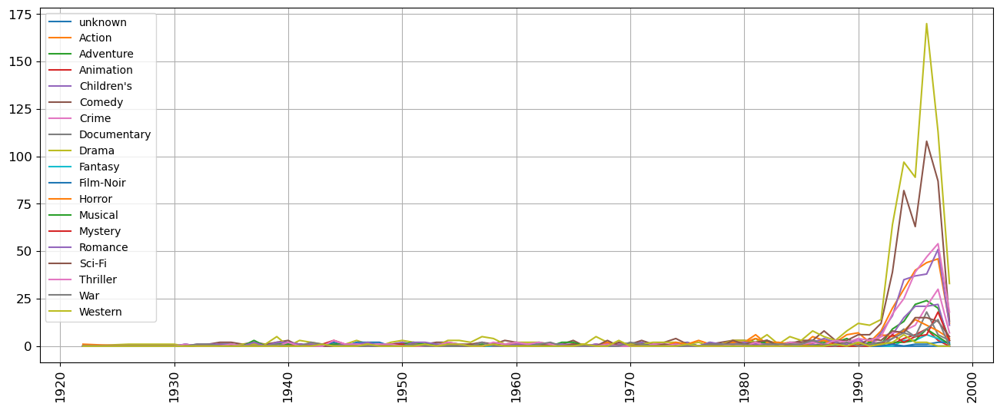

In [38]:
count=0
yearnow=0
for i in range(len(items)):
    if(yearnow!=items['year'][i]):
        count+=1
        yearnow=items['year'][i]

temp2 = items.drop('item_id',axis=1)

plt.figure(figsize=(16,6))
for i in range(2,len(temp2.columns)-1):
    columnname = temp2.iloc[:,i].name
    temp3 = temp2.loc[:,['year',columnname]]
    temp3 = temp3.groupby(by=['year']).sum()
    plt.title(label=temp3.columns.name,fontsize=40,loc='center')
    plt.plot(temp3.index,temp3.iloc[:,0],label = temp3.columns[0])
    plt.xticks(rotation=90)
plt.grid()
plt.legend()
plt.show()

<h3> Based on Occupation </h3>

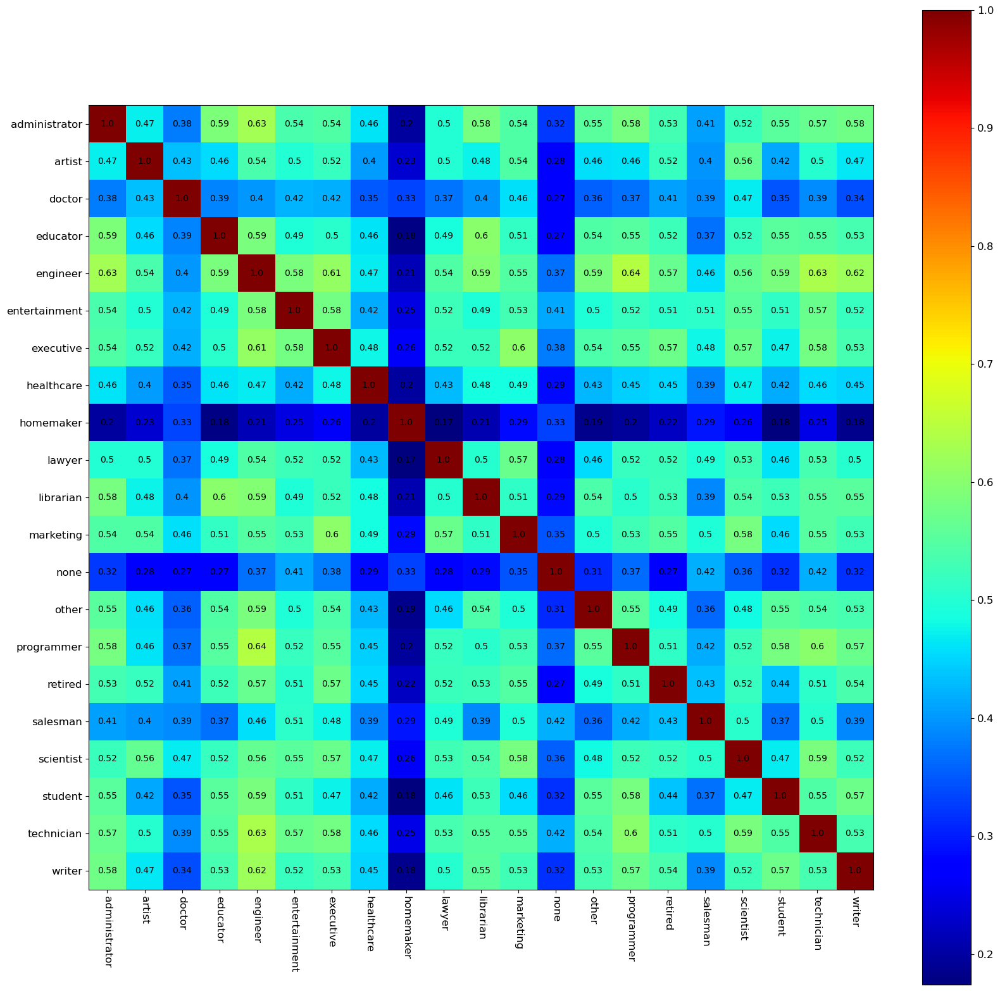

In [39]:
pp.getSimOccup('True')

<h3>Age Category Query</h3>
For presentation, if we want to show why the accuracy for age_category 6 is really not related to 7 (it's for the function below)

In [40]:
display(users.query('age_category >=6'))

,user_id,age,gender,occupation,zip_code,age_category
105,106,61,1,15,55125,6
210,211,66,1,16,32605,6
265,266,62,0,0,78756,6
317,318,65,1,15,06518,6
348,349,68,1,15,61455,6
350,351,61,1,3,49938,6
363,364,63,1,4,01810,6
422,423,64,1,13,91606,6
480,481,73,1,15,37771,7
519,520,62,1,7,12603,6


<h3> Based on age category </h3>

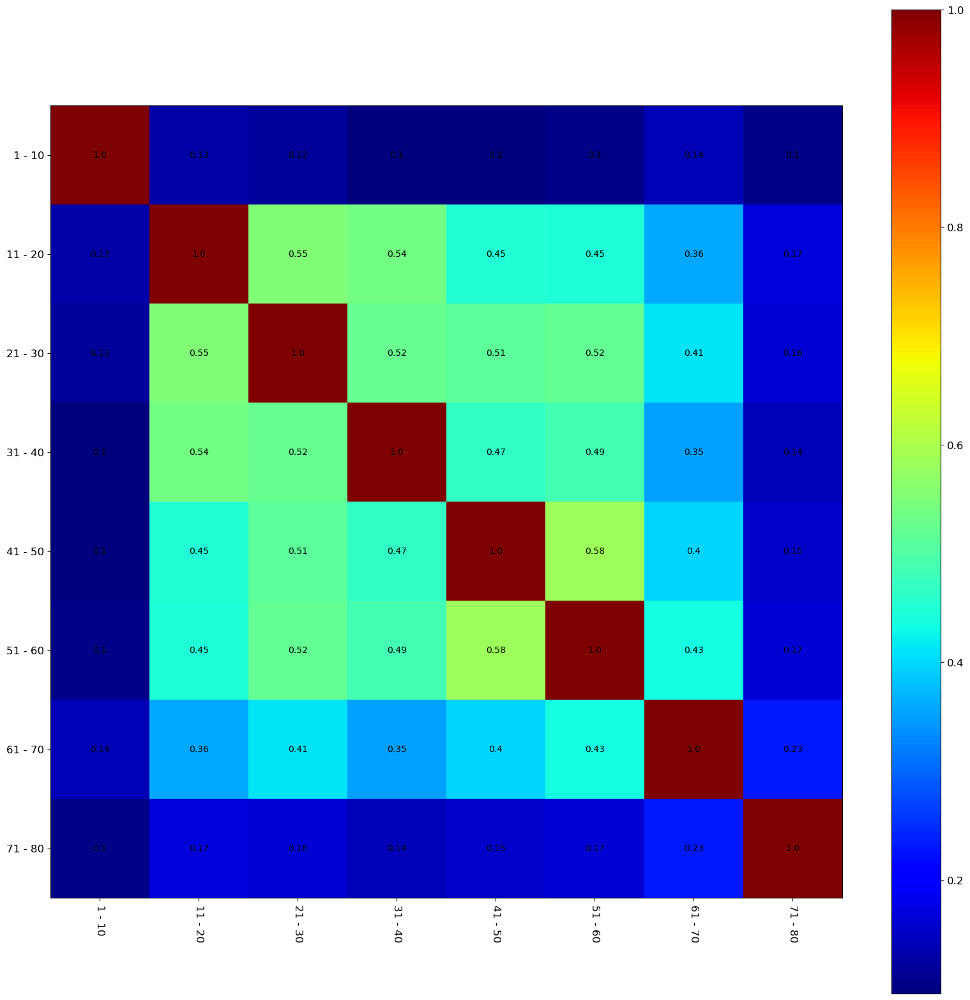

In [41]:
pp.getSimAgeCategory('True')

<h3>Specifying data to analyze based on user</h3>
Returns a pandas data frame with the user_id, item_id, rating and any specified category from the user attributes. takes input from user data and ratings data

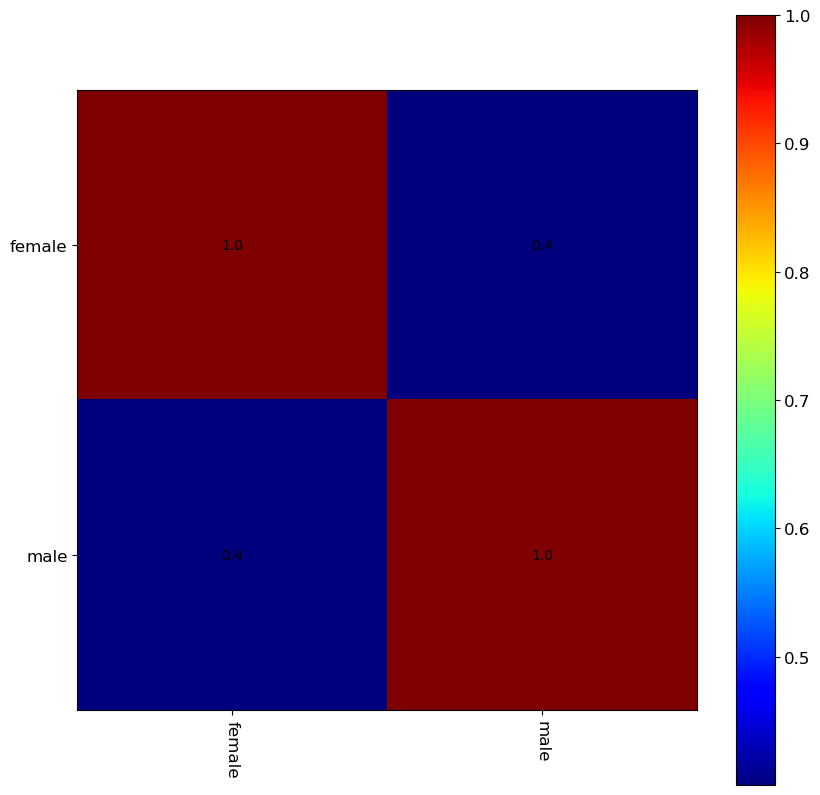

In [42]:
pp.getSimGender('True')

<h3>Specifying data to analyze based on item</h3>
Returns a pandas data frame with the item_id, item_id, rating and any specified category(only between "year" and "genre") from the item attributes, takes input from user data and ratings data

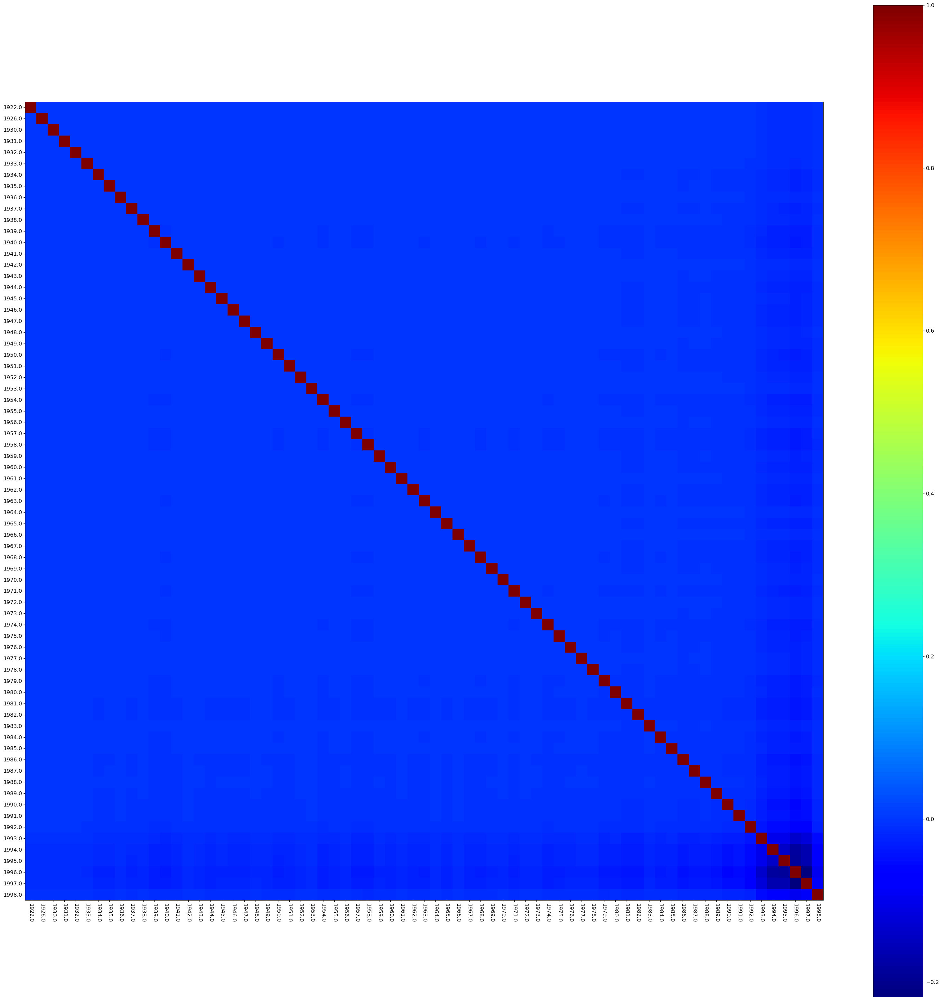

In [43]:
pp.getSimItemYear('True')

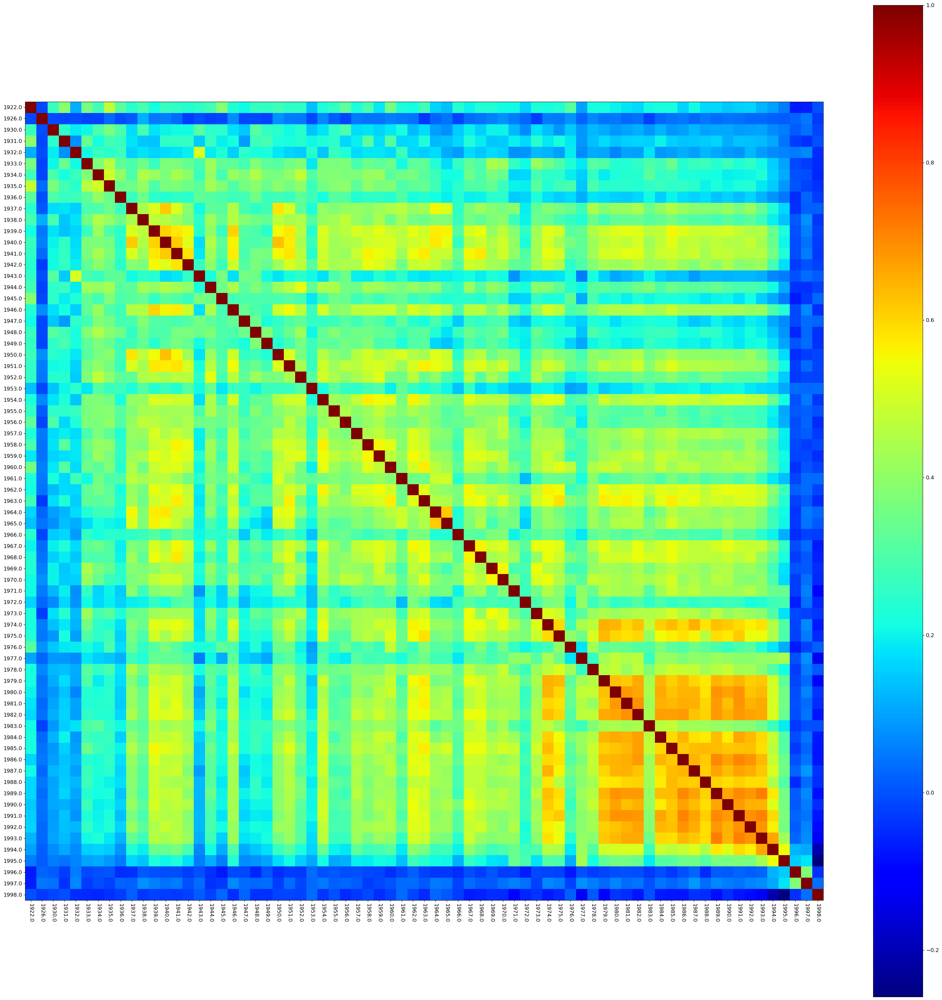

In [44]:
pp.getSimUserYear('True')

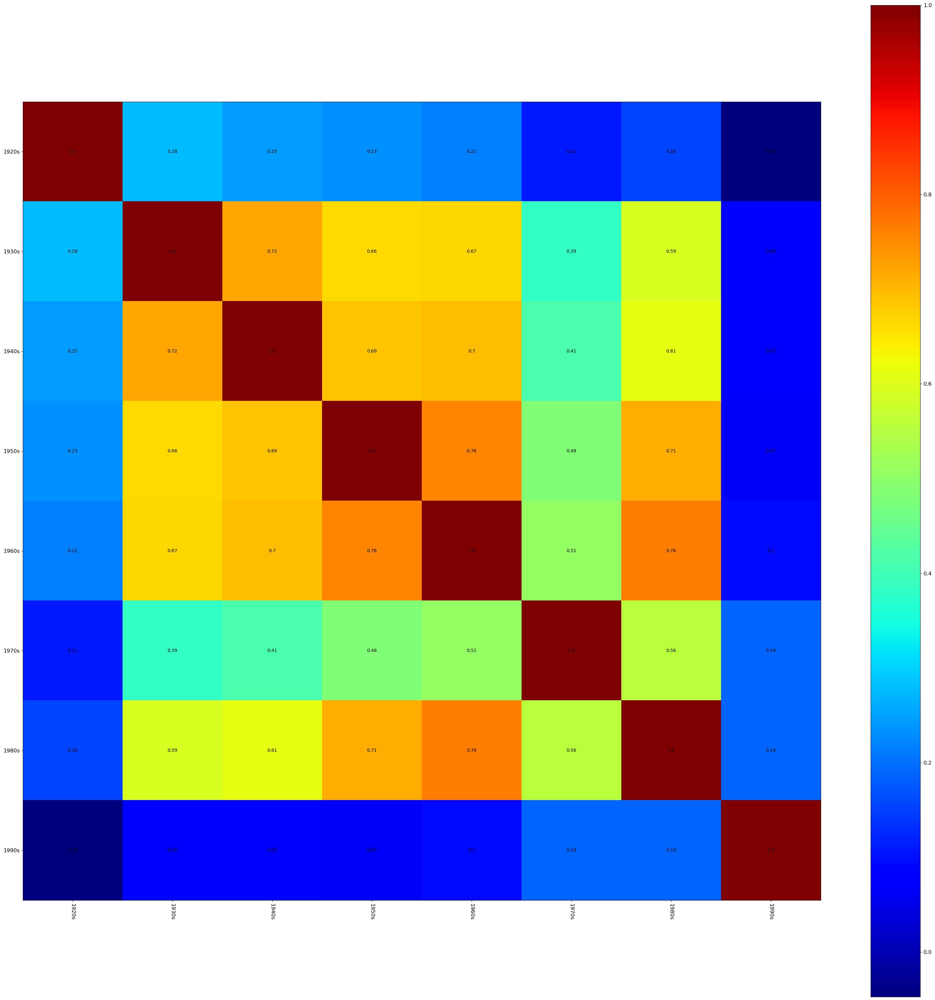

In [45]:
pp.getSimUserYearCategory('True')

<h3> Get the Sim Genre </h3>

In [46]:
pp.getSimGenre()

array([[0.        , 1.        , 1.        , ..., 1.        , 0.66666667,
        1.        ],
       [1.        , 0.        , 0.66666667, ..., 1.        , 1.        ,
        1.        ],
       [1.        , 0.66666667, 0.        , ..., 1.        , 1.        ,
        1.        ],
       ...,
       [1.        , 1.        , 1.        , ..., 0.        , 1.        ,
        0.5       ],
       [0.66666667, 1.        , 1.        , ..., 1.        , 0.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 0.5       , 1.        ,
        0.        ]])

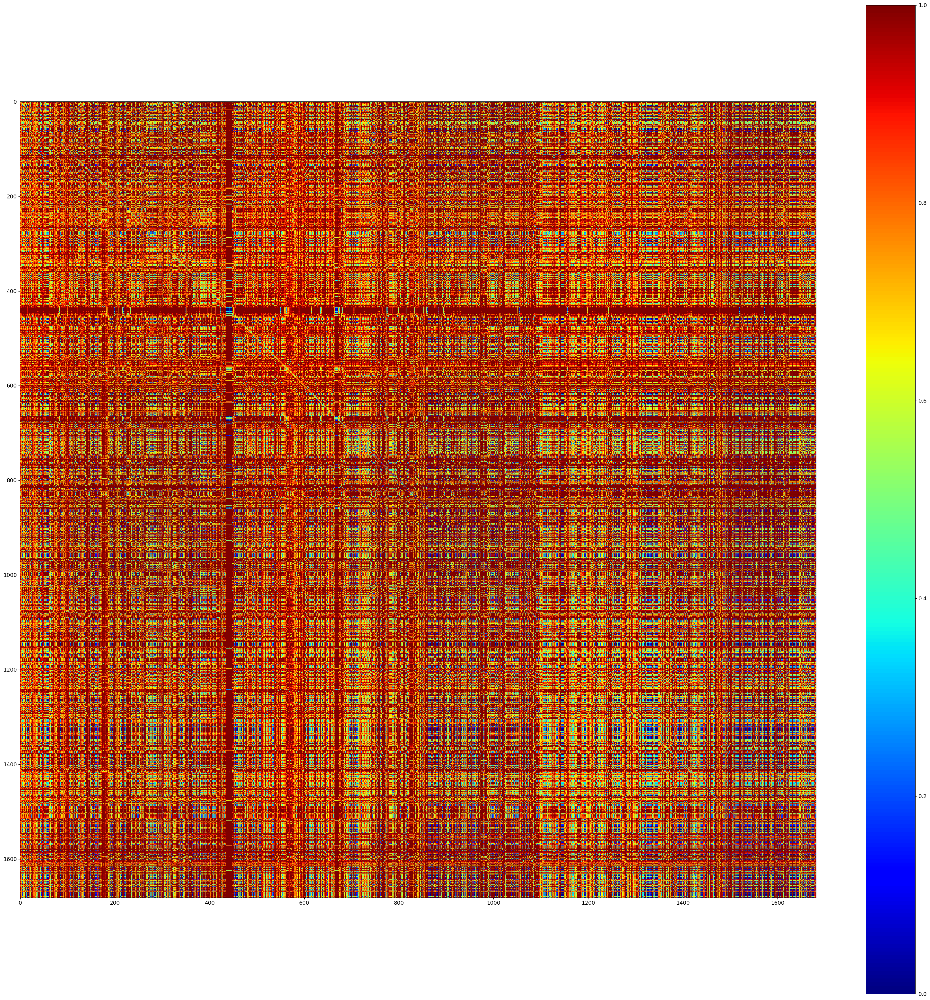

In [47]:
pp.getSimGenre("printSim")

<h2> Analyse Movie Data </h2>

<h3>Start of teacher's code</h3>
-----------------------------------------

In [48]:
genre = pd.read_csv("ml-100k/u.genre", sep = '|', header = None)
genre_list = genre[0].values
movie_set_genre = movies[genre_list]

In [49]:
from sklearn.cluster import KMeans
k = 50
kmeans = KMeans(n_clusters=k)
kmeans.fit_predict(movie_set_genre)

array([35, 27,  8, ..., 11,  2,  1])

In [50]:
kmeans.inertia_

296.69323983599753

In [51]:
import scipy.spatial.distance as sp_dist
genre_array = movie_set_genre.to_numpy()

print(genre_array.shape)

x = genre_array[0]
y = genre_array[1]
print(x)
print(y)
print(sp_dist.cosine(x,y))
print(sp_dist.euclidean(x,y))
print(sp_dist.jaccard(x,y))

(1682, 19)
[0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0]
1.0
2.449489742783178
1.0


In [52]:
# compute the matrix of all pairwise distances of movies
import sklearn.metrics as metrics

distance_matrix = metrics.pairwise_distances(genre_array,metric = 'jaccard') # ‘cosine’, ‘euclidean’, etc
print(distance_matrix.shape)
print(distance_matrix)

(1682, 1682)
[[0.         1.         1.         ... 1.         0.66666667 1.        ]
 [1.         0.         0.66666667 ... 1.         1.         1.        ]
 [1.         0.66666667 0.         ... 1.         1.         1.        ]
 ...
 [1.         1.         1.         ... 0.         1.         0.5       ]
 [0.66666667 1.         1.         ... 1.         0.         1.        ]
 [1.         1.         1.         ... 0.5        1.         0.        ]]


In [53]:
init_num_clusters = len(movie_set_genre.columns)

-------------------------------------
<h3>End of teacher's code</h3>

<h2>Genre Analysis </h2>

In [54]:
info = pd.read_csv("ml-100k/u.info",sep= " ",header=None)
info.to_numpy()

print(info)
numUsers=info[0][0]
numMovies= info[0][1]
numRatings= info[0][2]
rating.info()

        0        1
0     943    users
1    1682    items
2  100000  ratings
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   user_id  100000 non-null  int64
 1   item_id  100000 non-null  int64
 2   rating   100000 non-null  int64
dtypes: int64(3)
memory usage: 2.3 MB


In [55]:
# get the average rating per genre
def get_avg_genre_ratings(rating,movies,genres):
  avg_genre_ratings = []
  for g in genres:
    genre_movies = movies[movies[g]==1]
    avg_rating_genre = round(rating[rating['item_id'].isin(genre_movies['item_id'])].loc[:,'rating'].mean(),2)
    avg_genre_ratings.append(avg_rating_genre)
    #avg_genre_rating[g] = pd.Series(avg_rating_genre, index=[0]).to_frame()

  return avg_genre_ratings

In [56]:
avg_genre_ratings = get_avg_genre_ratings(rating, movies,genre_list)
print(avg_genre_ratings)

[3.2, 3.48, 3.5, 3.58, 3.35, 3.39, 3.63, 3.67, 3.69, 3.22, 3.92, 3.29, 3.52, 3.64, 3.62, 3.56, 3.51, 3.82, 3.61]


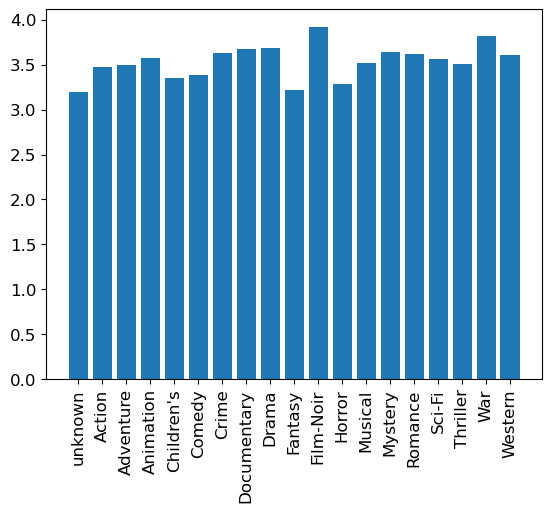

In [57]:
#plot a histogram of the various genres
plt.bar(x=movie_set_genre.columns,height=avg_genre_ratings)
plt.xticks(rotation = 90)
plt.show()

<h3> Genre User-Based Insights </h3>

In [58]:
avg_genre_header = ['avg_unknown_rating','avg_action_rating','avg_adventure_rating','avg_animation_rating','avg_children_rating', 'avg_comedy_rating','avg_crime_rating','avg_documentary_rating','avg_drama_rating','avg_fantasy_rating','avg_film_noir_rating','avg_horror_rating','avg_musical_rating','avg_mystery_rating','avg_romance_rating','avg_scifi_rating','avg_thriller_rating','avg_war_rating','avg_western-rating']

In [59]:
#get the users average rating per genre
def get_user_genre_ratings(rating,movies,genres,columns_names):
  user_genre_ratings= pd.DataFrame()
  for g in genres:
    genre_movies = movies[movies[g] == 1 ]
    avg_genre_rating_per_user= rating[rating['item_id'].isin(genre_movies['item_id'])].loc[:, ['user_id', 'rating']].groupby(['user_id'])['rating'].mean().round(2)
    user_genre_ratings = pd.concat([user_genre_ratings, avg_genre_rating_per_user], axis=1 )
          
  user_genre_ratings.columns = columns_names
  return user_genre_ratings

In [60]:
user_genre_ratings = get_user_genre_ratings(rating, movies,genre_list,avg_genre_header )
user_genre_ratings.head()

,avg_unknown_rating,avg_action_rating,avg_adventure_rating,avg_animation_rating,avg_children_rating,avg_comedy_rating,avg_crime_rating,avg_documentary_rating,avg_drama_rating,avg_fantasy_rating,avg_film_noir_rating,avg_horror_rating,avg_musical_rating,avg_mystery_rating,avg_romance_rating,avg_scifi_rating,avg_thriller_rating,avg_war_rating,avg_western-rating
1,4.0,3.33,2.93,3.33,2.20,3.47,3.44,4.80,3.93,3.50,5.00,3.46,2.92,3.60,3.93,4.00,3.62,3.68,3.67
5,4.0,3.14,3.24,3.79,2.45,3.00,3.89,NaN,2.67,2.50,5.00,2.54,3.33,3.00,2.32,3.52,2.95,3.21,2.50
130,5.0,3.88,3.93,4.53,4.26,3.88,3.90,4.00,4.21,4.40,3.67,3.91,4.65,3.92,4.30,3.93,3.96,4.29,3.33
181,1.0,1.47,1.48,1.78,1.41,1.40,1.41,1.15,1.54,1.33,1.67,1.87,2.12,1.88,1.72,1.90,1.82,1.79,1.00
268,3.0,2.87,2.98,3.38,2.76,2.82,3.14,4.00,3.29,2.40,3.71,2.48,3.00,3.38,3.12,3.10,2.93,3.85,3.40


In [61]:
#experimental
#look for insight

user_genre_ratings.describe()

,avg_unknown_rating,avg_action_rating,avg_adventure_rating,avg_animation_rating,avg_children_rating,avg_comedy_rating,avg_crime_rating,avg_documentary_rating,avg_drama_rating,avg_fantasy_rating,avg_film_noir_rating,avg_horror_rating,avg_musical_rating,avg_mystery_rating,avg_romance_rating,avg_scifi_rating,avg_thriller_rating,avg_war_rating,avg_western-rating
count,10.000000,938.000000,901.000000,659.00000,805.000000,940.000000,914.000000,352.000000,943.000000,512.000000,618.000000,789.000000,754.000000,897.000000,943.000000,908.000000,937.000000,925.000000,491.000000
mean,3.200000,3.518827,3.527603,3.57827,3.372497,3.449723,3.643228,3.748722,3.728473,3.276328,3.892152,3.343701,3.422599,3.612731,3.659152,3.550385,3.546638,3.779978,3.668248
std,1.316561,0.588765,0.683275,0.83397,0.835904,0.549931,0.710548,1.031132,0.476117,0.977997,0.839753,0.805866,0.860933,0.737231,0.541121,0.663253,0.547051,0.646286,0.807355
min,1.000000,1.000000,1.000000,1.00000,1.000000,1.330000,1.000000,1.000000,1.540000,1.000000,1.000000,1.000000,1.000000,1.000000,1.670000,1.000000,1.250000,1.000000,1.000000
25%,3.000000,3.182500,3.100000,3.00000,3.000000,3.120000,3.250000,3.000000,3.440000,2.800000,3.400000,3.000000,3.000000,3.140000,3.360000,3.200000,3.230000,3.500000,3.000000
50%,3.500000,3.575000,3.570000,3.67000,3.500000,3.480000,3.730000,4.000000,3.750000,3.250000,4.000000,3.380000,3.500000,3.670000,3.680000,3.600000,3.590000,3.860000,3.750000
75%,4.000000,3.917500,4.000000,4.00000,4.000000,3.810000,4.000000,4.500000,4.060000,4.000000,4.500000,4.000000,4.000000,4.000000,4.000000,4.000000,3.920000,4.210000,4.000000
max,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000



<h4> Movie Genre DataSet Clustering via PCA & Kmeans </h4>

In [62]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

reduced_movie_set = PCA(n_components=2).fit_transform(movie_set_genre)
k_means = KMeans(n_clusters=init_num_clusters,init='k-means++', random_state=42)
k_means.fit(reduced_movie_set)

KMeans(n_clusters=19, random_state=42)

In [63]:
# Step size of the mesh. Decrease to increase the quality of the VQ.
h = 0.02  # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_movie_set[:, 0].min() - 1, reduced_movie_set[:, 0].max() + 1
y_min, y_max = reduced_movie_set[:, 1].min() - 1, reduced_movie_set[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

<Figure size 640x480 with 0 Axes>

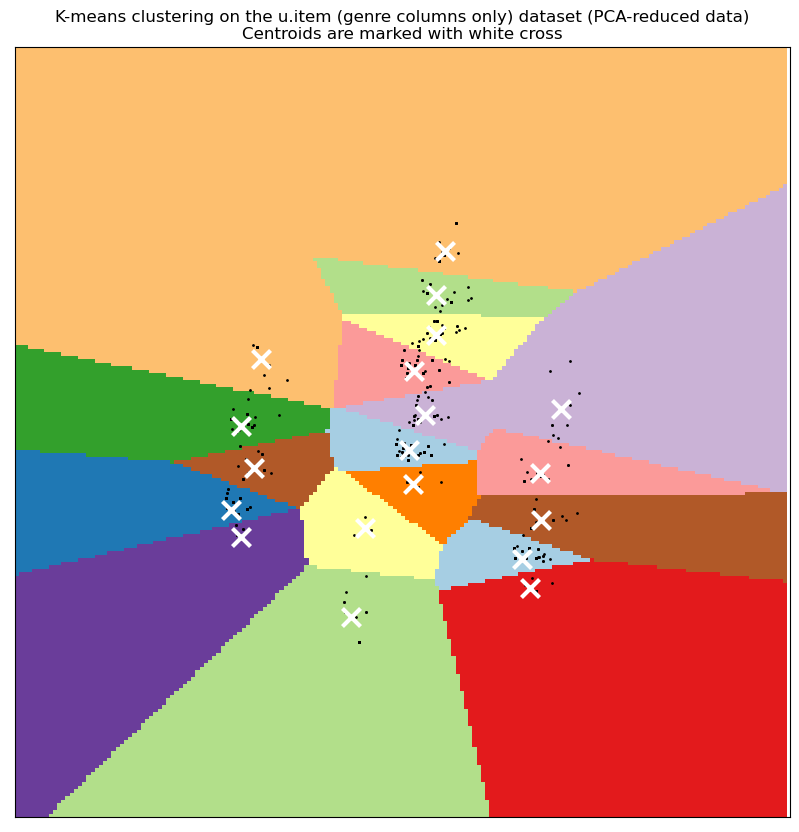

In [64]:
# Obtain labels for each point in mesh. Use last trained model.
Z = k_means.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.figure(figsize=(10,10))

plt.clf()
plt.imshow(
    Z,
    interpolation="nearest",
    extent=(xx.min(), xx.max(), yy.min(), yy.max()),
    cmap=plt.cm.Paired,
    aspect="auto",
    origin="lower",
)

plt.plot(reduced_movie_set[:, 0], reduced_movie_set[:, 1], "k.", markersize=2)
# Plot the centroids as a white X
centroids = k_means.cluster_centers_
plt.scatter(
    centroids[:, 0],
    centroids[:, 1],
    marker="x",
    s=169,
    linewidths=3,
    color="w",
    zorder=10,
)
plt.title(
    "K-means clustering on the u.item (genre columns only) dataset (PCA-reduced data)\n"
    "Centroids are marked with white cross"
)

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

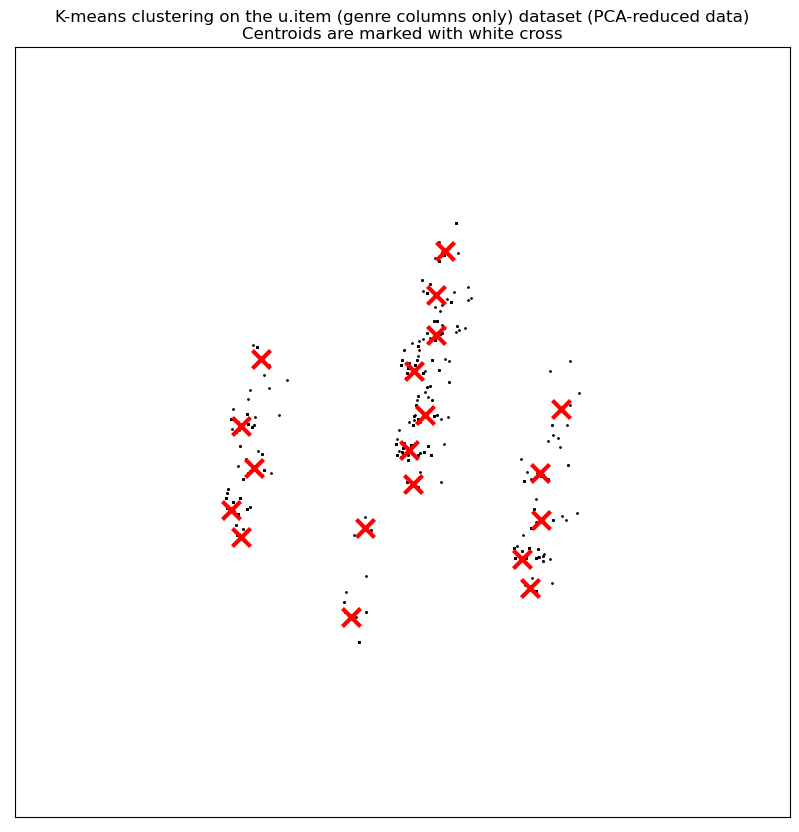

In [65]:
plt.figure(figsize=(10,10))
plt.plot(reduced_movie_set[:, 0], reduced_movie_set[:, 1], "k.", markersize=2)
# Plot the centroids as a white X
centroids = k_means.cluster_centers_
plt.scatter(
    centroids[:, 0],
    centroids[:, 1],
    marker="x",
    s=169,
    linewidths=3,
    color="r",
    zorder=10,
)
plt.title(
    "K-means clustering on the u.item (genre columns only) dataset (PCA-reduced data)\n"
    "Centroids are marked with white cross"
)


plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

<h5> Finding the Optimal Cluster number for kmeans </h5>

In [66]:
# possible number of clusters in the reduced dataset
range_of_clusters = np.arange(2,20)

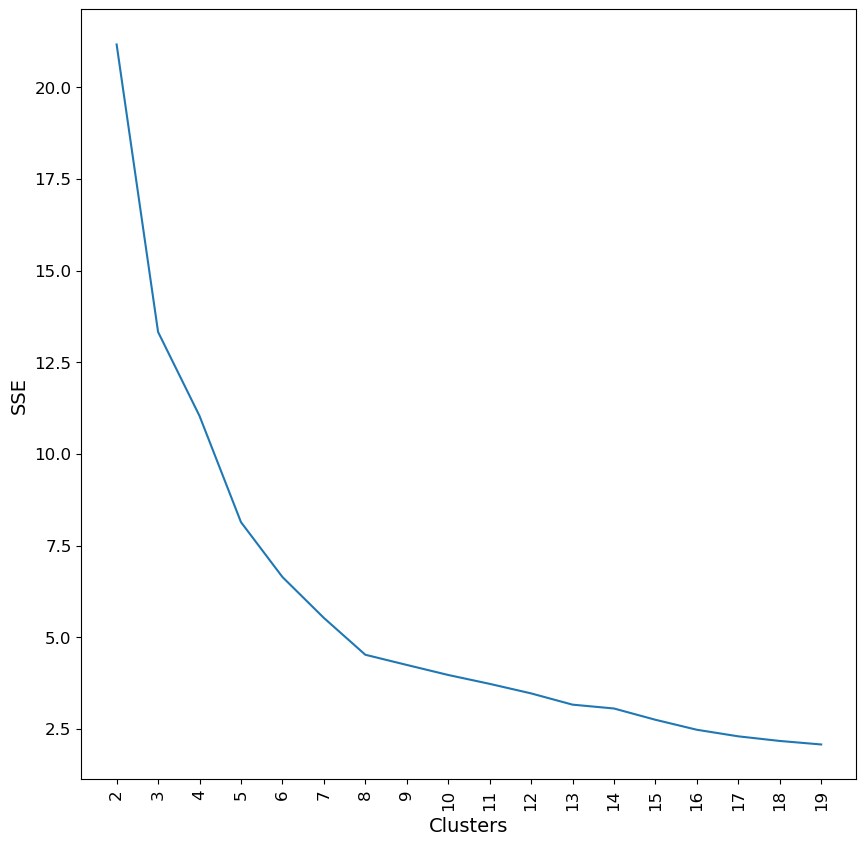

In [67]:
#elbow method
wcss = []
for i in range_of_clusters:
  k_means = KMeans(n_clusters=i,init='k-means++', random_state=42)
  k_means.fit_predict(reduced_movie_set)
  #scale the wcss vale
  wcss.append(np.sqrt(k_means.inertia_))
#plot elbow curve
fig = plt.figure(figsize=(10,10))
plt.plot(range_of_clusters,wcss)
plt.xticks(range_of_clusters,rotation=90)
plt.xlabel('Clusters')
plt.ylabel('SSE')
plt.show()

In [68]:

def silhouetteAnalysis(range_of_clusters,reduced_movie_set):

  for n_clusters in range_of_clusters:

    # Create a subplot with 1 row and 2 columns
      fig, (ax1, ax2) = plt.subplots(1, 2)
      fig.set_size_inches(18, 7)

      # The 1st subplot is the silhouette plot
      # The silhouette coefficient can range from -1, 1 but in this example all
      # lie within [-0.1, 1]
      ax1.set_xlim([-0.1, 1])
      # The (n_clusters+1)*10 is for inserting blank space between silhouette
      # plots of individual clusters, to demarcate them clearly.
      ax1.set_ylim([0,len(reduced_movie_set)+(n_clusters + 1) * 10])

      k_means = KMeans(n_clusters=n_clusters,init='k-means++', random_state=42)
      cluster_labels = k_means.fit_predict(reduced_movie_set)

      silhouette_avg = silhouette_score(reduced_movie_set , cluster_labels)
      
      sample_silhouette_values = silhouette_samples(reduced_movie_set, cluster_labels)

      y_lower = 10

      for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
        np.arange(y_lower, y_upper),
        0,
        ith_cluster_silhouette_values,
        facecolor=color,
        edgecolor=color,
        alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples


        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
        reduced_movie_set[:,0], reduced_movie_set[:,1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )

        # Labeling the clusters
        centers = k_means.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(
          centers[:, 0],
          centers[:, 1],
          marker="o",
          c="white",
          alpha=1,
          s=200,
          edgecolor="k",
        )

        for i, c in enumerate(centers):
          ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

      ax2.set_title("The visualization of the clustered data.")
      ax2.set_xlabel("Feature space for the 1st feature")
      ax2.set_ylabel("Feature space for the 2nd feature")

      plt.suptitle(
          "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
          % n_clusters,
          fontsize=14,
          fontweight="bold",
      )

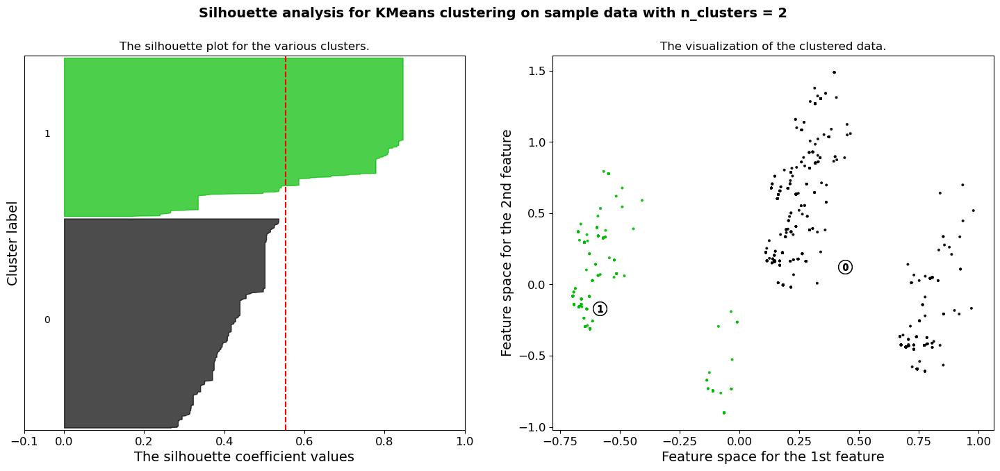

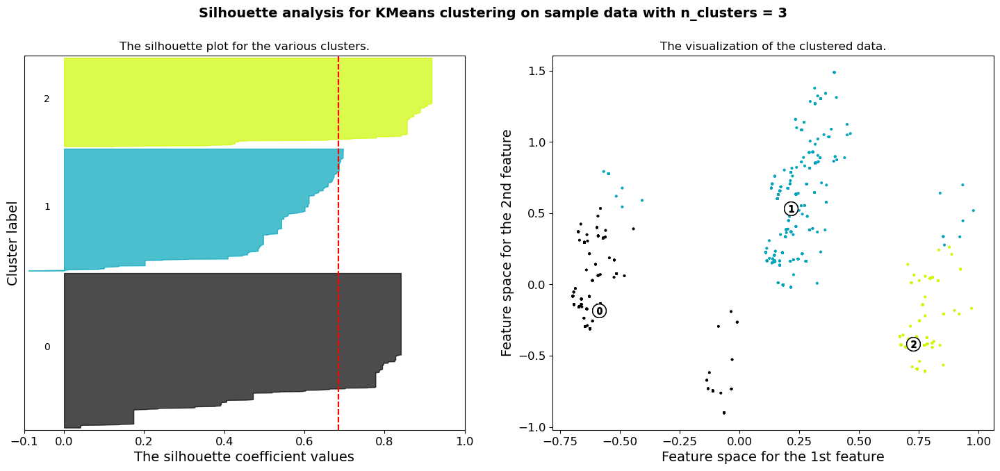

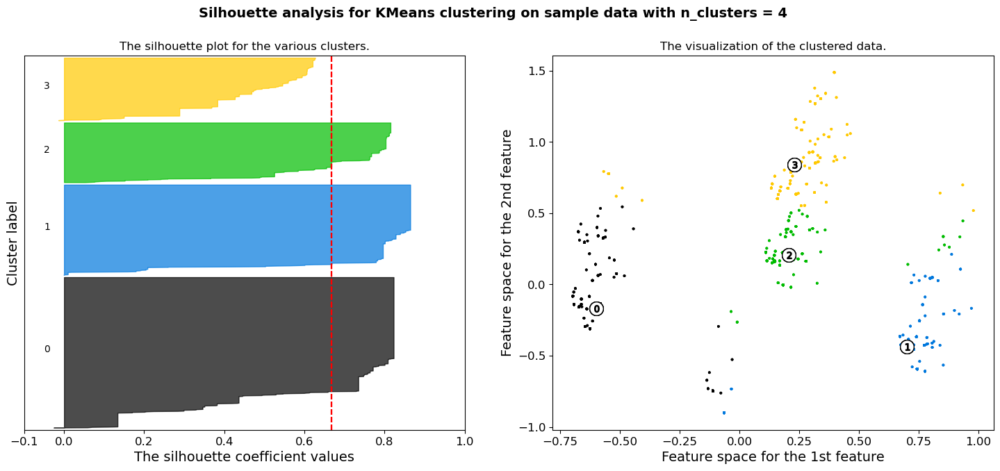

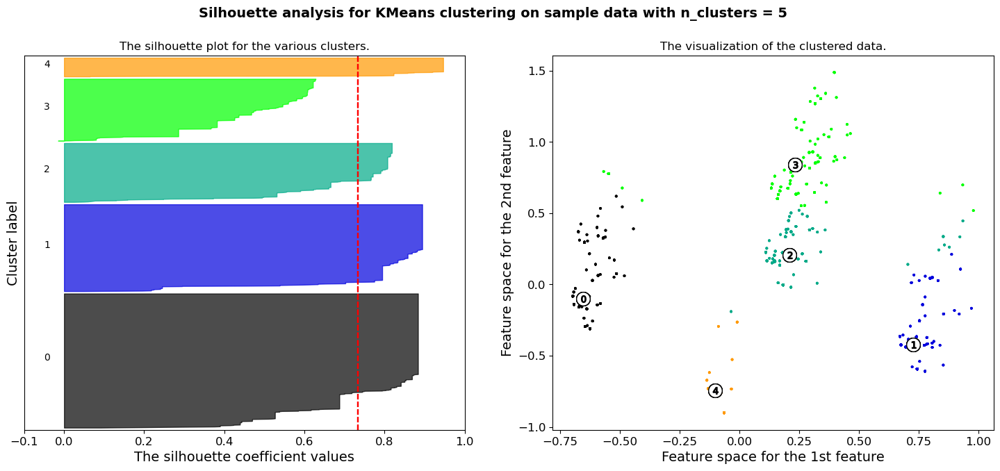

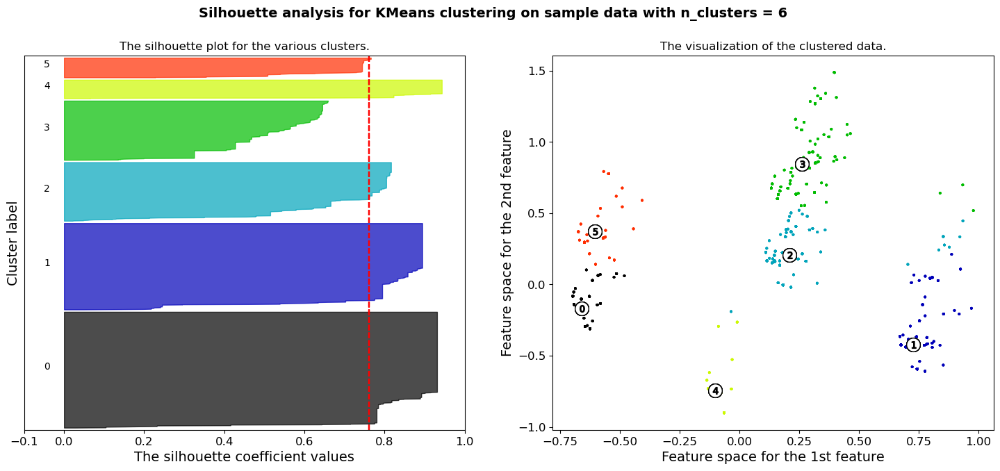

...

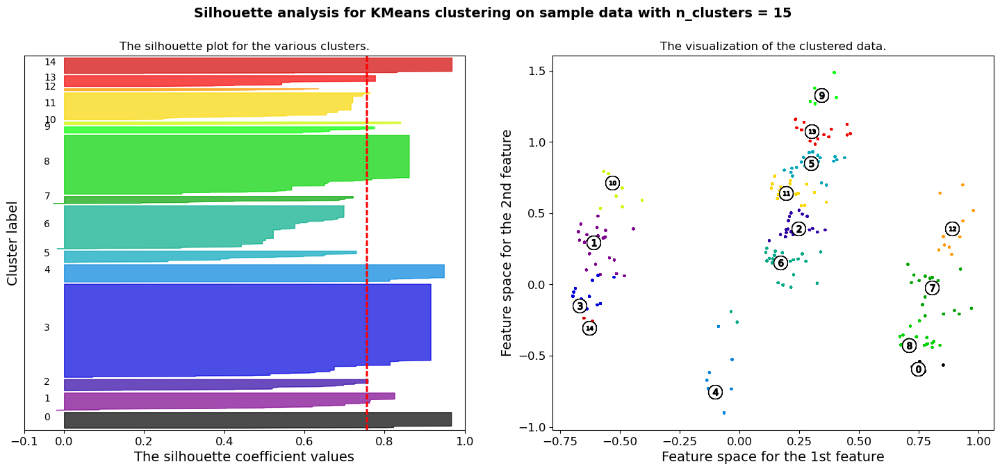

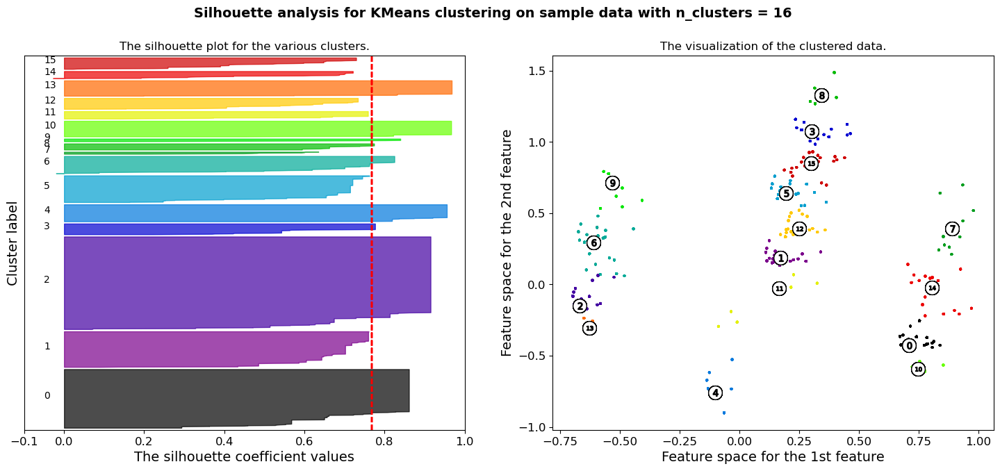

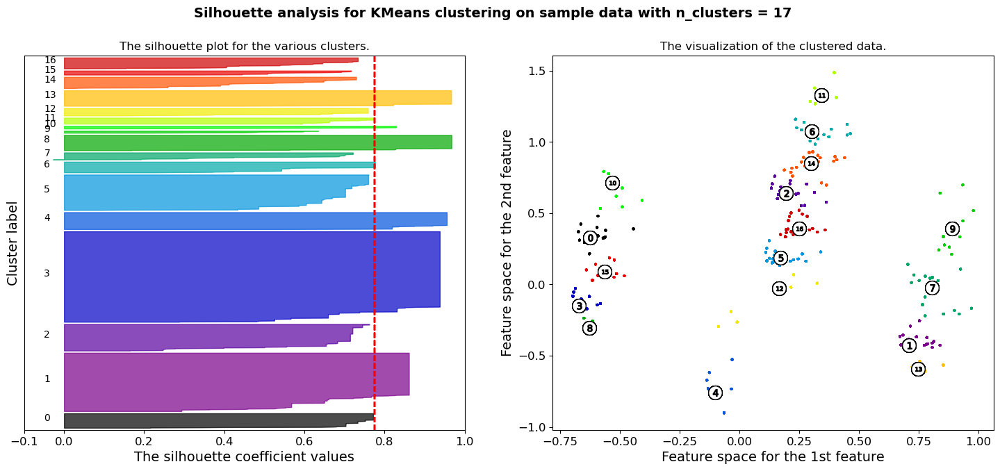

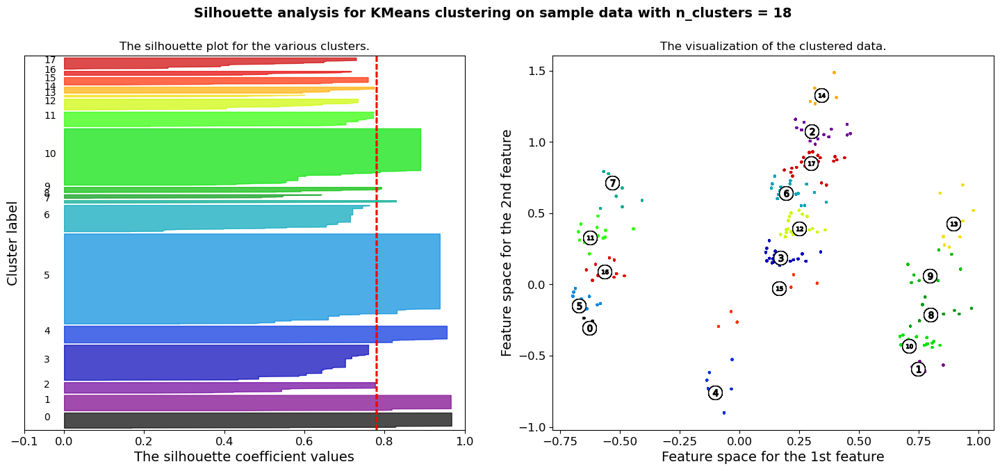

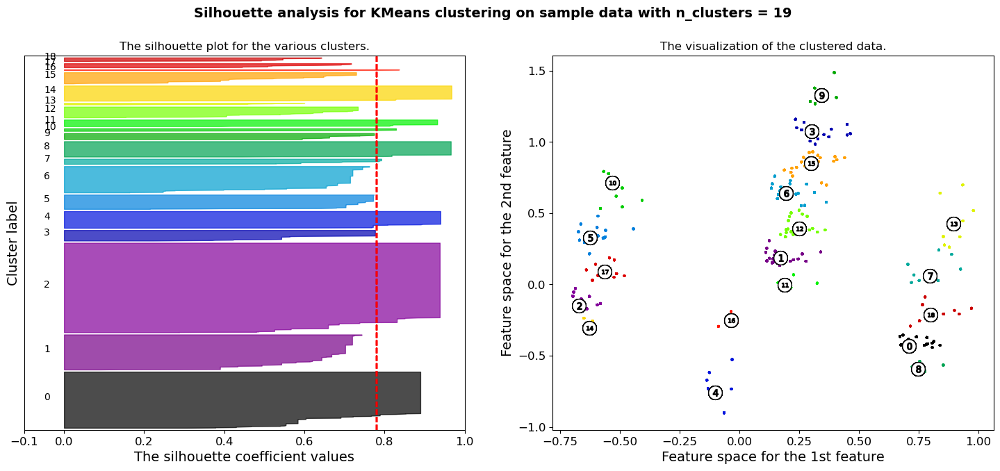

In [69]:
from sklearn.metrics import silhouette_samples,silhouette_score

silhouetteAnalysis(range_of_clusters,reduced_movie_set)

<h4> PairWise Distance Matrix (Movie) </h4>

In [70]:
import scipy.spatial.distance as sp_dist
genre_array = movie_set_genre.to_numpy()

x = genre_array[0]
y = genre_array[1]
print(sp_dist.cosine(x,y))
print(sp_dist.euclidean(x,y))
print(sp_dist.jaccard(x,y))

1.0
2.449489742783178
1.0


In [71]:
# compute the matrix of all pairwise distances of movies
import sklearn.metrics as metrics

distance_matrix = metrics.pairwise_distances(genre_array,metric = 'jaccard') # ‘cosine’, ‘euclidean’, etc
labeled_dist_matrix= pd.DataFrame(distance_matrix,index = movies["title"] , columns = movies["title"]) # add row and column headers


Text(0.5, 1.0, 'HeatMap Showing the PairWise Distance Matrix')

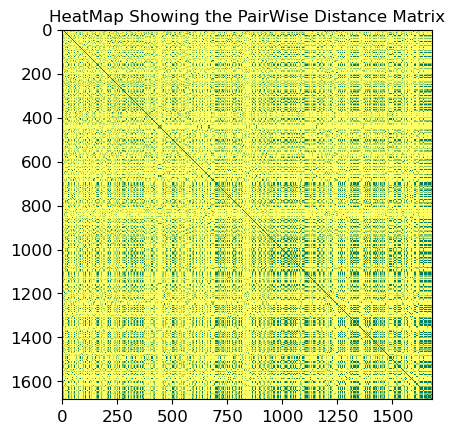

In [72]:
#plot a heatmap of the pairwise movie matrix
plt.imshow( labeled_dist_matrix, interpolation = 'nearest',cmap="summer")
plt.title('HeatMap Showing the PairWise Distance Matrix')


# Models

<h2> Item Based CF </h2>

In [73]:
import pandas as pd
import numpy as np
import preprocessingFuncts as pp
from sklearn import neighbors
from sklearn.model_selection import train_test_split, cross_val_score
import matplotlib.pyplot as plt

In [74]:
#all base datas

def readData(paths, base='', categories=[]):
  arr = []
  itemData = pp.readItemData()
  userData = pp.readUserData()
  for path in paths:
    ratingData = pp.readRatingData(path)
    data = 0
    if base == "user":
      data = pp.specifyByUserData(userData, ratingData, categories)
    elif base == "item":
      data = pp.specifyByItemData(itemData, ratingData, categories)
    else:
      data = ratingData
    data = data.dropna()
    y = data.loc[:, 'rating']
    x = data.copy()
    x = x.drop(['rating'], axis='columns')
    arr.append({'x': x, 'y': y, 'name': path[8:10], 'type': path[-4:]})
  return arr

<h3>Creating The Model Class</h3>
We created a class for collaborative filtering which takes in a few optional parameters and one required parameter.

<b>Required Parameter</b>
<ul><li>base    : can be either 'item' based or 'user' based</ul>
<b>Required Parameter</b>
<ul>
<li>k         : The number of k neighbours to take to consideration
<li>threshold : The minimum number of times an item needs to be rated to be considered for similarity analysis
<li>metric    : The method to determine distance for similarity. 
</ul>

In [75]:
from models import CF

#Creating the model & training it
IBCF = CF('item')
IBCF.fit('ml-100k\\ua.base')

After the first data fitting, our model creates 3 data structures to reference for the prediction.
<ul>
<li><b>Data Dataframe :</b> to store the data that was inputted and it's output in the form of a pandas dataframe
<li><b>Data Matrix :</b> a pivot table form of the ratings, based on the user and item.
<li><b>Similarity Matrix :</b> The matrix that saves the similarity of one movie to another based on how users rated them.
</ul>

In [76]:
#Viewing the data matrix
IBCF.dataMatrix

,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
1,5.0,3.0,4.0,3.0,3.0,5.0,4.0,1.0,5.0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
940,NaN,NaN,NaN,2.0,NaN,NaN,4.0,5.0,3.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
941,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [77]:
IBCF.simMatrix

,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
1,1.000000,0.234405,0.220399,0.099681,0.392978,NaN,0.220181,0.256044,0.130358,0.160742,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.234405,1.000000,0.252444,0.228276,0.221987,NaN,0.169861,0.340345,-0.274889,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.220399,0.252444,1.000000,-0.191251,NaN,NaN,0.125420,-0.118587,0.057506,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.099681,0.228276,-0.191251,1.000000,-0.256932,NaN,0.171199,0.290841,0.214934,0.165357,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.392978,0.221987,NaN,-0.256932,1.000000,NaN,0.187546,0.215499,0.097367,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1679,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1680,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below is the prediction results of our model

In [78]:
#Making ratings prediction

testData = pp.readRatingData('ml-100k\\ua.test')
testX, testY =  testData.loc[:,['user_id','item_id']],testData.loc[:,'rating']

predY = IBCF.predict(testX)
print(predY)

[5, 4, 5, 3, 4, 4, 5, 4, 4, 3, 4, 4, 4, 4, 4, 4, 5, 5, 4, 0, 3, 3, 3, 3, 3, 3, 2, 0, 0, 3, 4, 4, 4, 4, 4, 5, 4, 4, 4, 0, 3, 3, 3, 3, 0, 3, 4, 0, 0, 0, 3, 4, 3, 3, 5, 3, 3, 4, 4, 5, 5, 4, 4, 5, 4, 4, 5, 4, 5, 5, 4, 4, 5, 4, 4, 3, 4, 3, 0, 4, 0, 4, 4, 4, 5, 5, 4, 4, 5, 0, 4, 0, 4, 4, 5, 4, 5, 5, 5, 5, 3, 0, 4, 3, 4, 4, 0, 0, 4, 4, 5, 5, 4, 4, 5, 4, 4, 5, 4, 5, 3, 2, 3, 4, 3, 3, 5, 0, 4, 0, 4, 4, 4, 5, 3, 4, 5, 4, 5, 5, 2, 3, 3, 3, 4, 3, 1, 2, 4, 2, 4, 5, 4, 4, 4, 4, 5, 5, 4, 5, 3, 3, 4, 3, 3, 3, 3, 2, 3, 3, 4, 4, 0, 3, 4, 5, 4, 4, 3, 0, 4, 4, 4, 3, 3, 3, 4, 4, 3, 3, 3, 4, 3, 3, 3, 3, 3, 2, 4, 4, 0, 3, 3, 3, 3, 0, 0, 4, 5, 0, 3, 3, 5, 3, 2, 0, 0, 2, 4, 0, 4, 4, 4, 4, 4, 4, 3, 4, 4, 0, 5, 4, 4, 4, 4, 0, 4, 4, 4, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 2, 0, 3, 3, 4, 3, 3, 0, 3, 3, 3, 0, 0, 4, 4, 4, 4, 4, 3, 4, 4, 3, 3, 4, 4, 3, 3, 4, 0, 3, 4, 3, 0, 4, 4, 4, 4, 4, 4, 0, 3, 0, 3, 4, 4, 3, 4, 5, 4, 4, 3, 4, 0, 3, 3, 4, 3, 3, 3, 4, 2, 3, 3, 4, 3, 4, 4, 3, 4, 4, 4, 4, 4, 1, 5, 1, 

In [79]:
from sklearn.metrics import classification_report

print(classification_report(testY, predY))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.43      0.02      0.05       542
           2       0.26      0.11      0.15       995
           3       0.34      0.37      0.35      2424
           4       0.40      0.55      0.46      3316
           5       0.47      0.19      0.28      2153

    accuracy                           0.34      9430
   macro avg       0.32      0.21      0.22      9430
weighted avg       0.39      0.34      0.34      9430



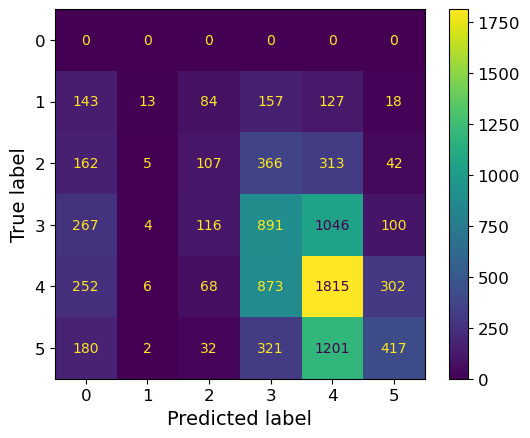

In [80]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

cm = confusion_matrix(
    testY,predY, labels = [0,1,2,3,4,5]
)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=[0,1,2,3,4,5])
disp.plot()
plt.show()

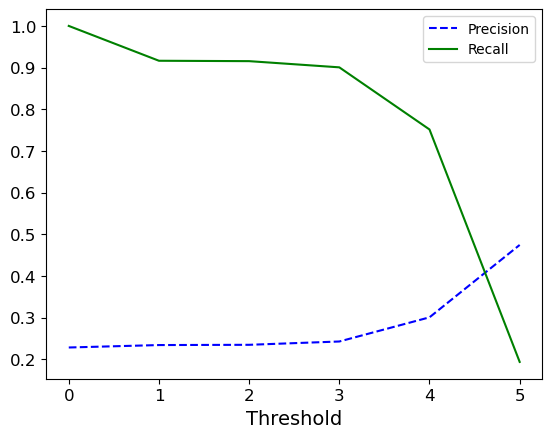

In [81]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve(
    testY, predY, pos_label=5)
plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
plt.legend()
plt.xlabel("Threshold")
plt.show()


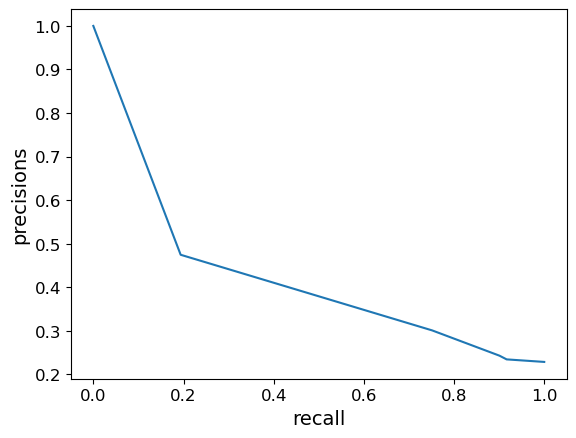

In [82]:
plt.plot(recalls,precisions)
plt.ylabel("precisions")
plt.xlabel("recall")
plt.show()

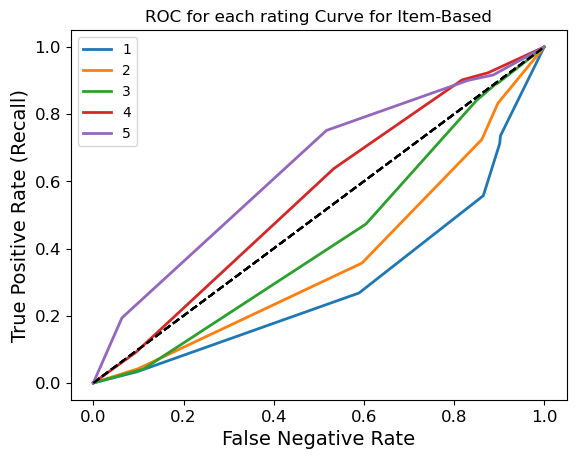

In [83]:
from sklearn.metrics import roc_curve
lines = []
for i in range (1,6):
    fpr, tpr, thresholds = roc_curve(testY, predY, pos_label=i)
    plt.plot(fpr, tpr, linewidth=2,label = i)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.ylabel("True Positive Rate (Recall)")
    plt.xlabel("False Negative Rate")
    plt.title('ROC for each rating Curve for Item-Based' )
plt.legend()


<h2> User Based CF </h2>

In [84]:
import pandas as pd
import numpy as np
import preprocessingFuncts as pp
from sklearn import neighbors
from sklearn.model_selection import train_test_split, cross_val_score
import matplotlib.pyplot as plt

In [85]:
#all base datas

def readData(paths, base='', categories=[]):
  arr = []
  itemData = pp.readItemData()
  userData = pp.readUserData()
  for path in paths:
    ratingData = pp.readRatingData(path)
    data = 0
    if base == "user":
      data = pp.specifyByUserData(userData, ratingData, categories)
    elif base == "item":
      data = pp.specifyByItemData(itemData, ratingData, categories)
    else:
      data = ratingData
    data = data.dropna()
    y = data.loc[:, 'rating']
    x = data.copy()
    x = x.drop(['rating'], axis='columns')
    arr.append({'x': x, 'y': y, 'name': path[8:10], 'type': path[-4:]})
  return arr

In [86]:
from models import CF

#Creating the model & training it
UBCF = CF('user')
UBCF.fit('ml-100k\\ua.base')

In [87]:
#Viewing the data matrix
UBCF.dataMatrix

,1,2,3,4,5,6,7,8,9,10,...,934,935,936,937,938,939,940,941,942,943
1,5.0,4.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,4.0,...,2.0,3.0,4.0,NaN,4.0,NaN,NaN,5.0,NaN,NaN
2,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
3,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3.0,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,4.0,...,5.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN
5,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1678,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1679,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1680,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
UBCF.simMatrix

,1,2,3,4,5,6,7,8,9,10,...,934,935,936,937,938,939,940,941,942,943
1,1.000000,NaN,NaN,NaN,0.394945,0.300065,0.280768,NaN,NaN,-0.105144,...,0.024319,NaN,0.419777,NaN,0.316224,NaN,0.32037,NaN,NaN,0.110617
2,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.394945,NaN,NaN,NaN,1.000000,0.250290,0.198398,NaN,NaN,0.026015,...,0.231196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.337450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
940,0.320370,NaN,NaN,NaN,NaN,-0.049325,0.023486,NaN,NaN,0.179605,...,-0.158268,NaN,NaN,NaN,NaN,NaN,1.00000,NaN,NaN,NaN
941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
942,NaN,NaN,NaN,NaN,NaN,0.053060,0.453177,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN


In [89]:
#Making ratings prediction

testData = pp.readRatingData('ml-100k\\ua.test')
testX, testY =  testData.loc[:,['user_id','item_id']],testData.loc[:,'rating']

predY = UBCF.predict(testX)
print(predY)

[4, 4, 4, 3, 2, 4, 4, 5, 4, 4, 3, 4, 5, 3, 3, 3, 4, 4, 3, 1, 5, 3, 3, 5, 3, 5, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 4, 2, 2, 3, 1, 1, 2, 4, 5, 4, 4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, 3, 4, 5, 4, 5, 5, 4, 5, 4, 4, 4, 3, 2, 3, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 3, 4, 5, 5, 4, 4, 4, 5, 4, 3, 2, 4, 3, 4, 4, 3, 2, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 5, 5, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 3, 4, 3, 4, 5, 4, 4, 5, 4, 4, 3, 4, 3, 4, 2, 3, 3, 3, 5, 4, 5, 5, 4, 4, 5, 5, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 4, 4, 4, 3, 5, 4, 4, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 5, 3, 3, 4, 4, 4, 3, 2, 2, 4, 4, 3, 3, 2, 2, 4, 4, 2, 3, 3, 4, 4, 4, 2, 1, 4, 5, 3, 4, 3, 4, 4, 3, 4, 3, 4, 4, 3, 5, 4, 4, 5, 4, 3, 5, 4, 4, 2, 4, 5, 4, 4, 5, 4, 5, 5, 3, 4, 4, 4, 4, 3, 4, 4, 4, 2, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 5, 3, 4, 3, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [90]:
from sklearn.metrics import classification_report

print(classification_report(testY, predY))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.22      0.03      0.05       542
           2       0.20      0.10      0.14       995
           3       0.34      0.28      0.31      2424
           4       0.39      0.35      0.37      3316
           5       0.47      0.12      0.20      2153

    accuracy                           0.23      9430
   macro avg       0.27      0.15      0.18      9430
weighted avg       0.37      0.23      0.27      9430



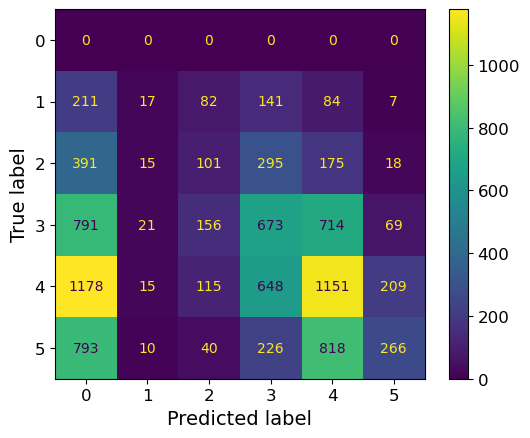

In [91]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

cm = confusion_matrix(
    testY,predY, labels = [0,1,2,3,4,5]
)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=[0,1,2,3,4,5])
disp.plot()
plt.show()

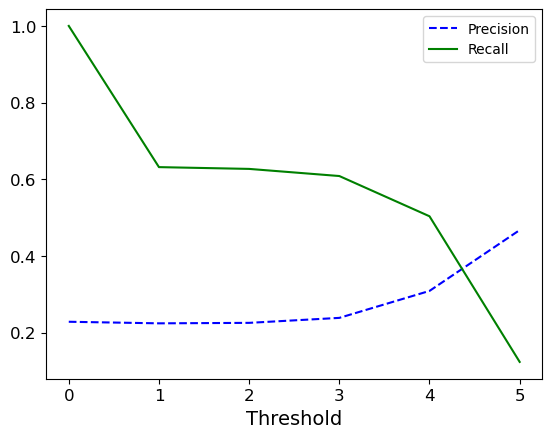

In [92]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve(
    testY, predY, pos_label=5)
plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
plt.legend()
plt.xlabel("Threshold")
plt.show()


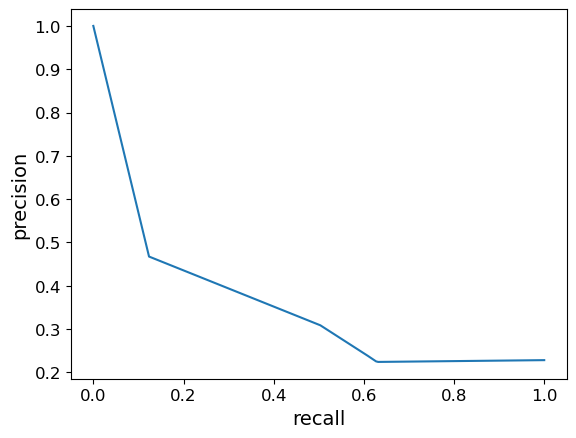

In [93]:
plt.plot(recalls,precisions)
plt.ylabel("precision")
plt.xlabel("recall")
plt.show()

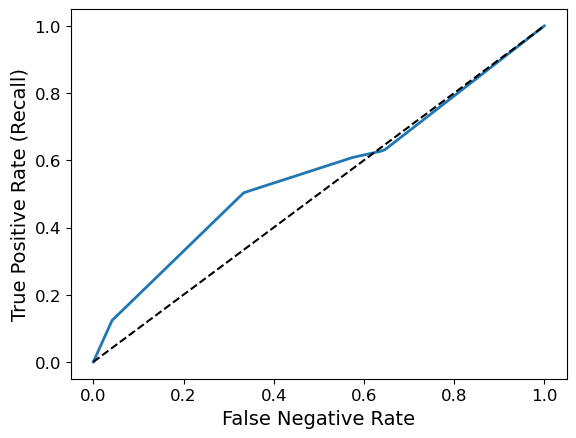

In [94]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(testY, predY, pos_label=5)
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0, 1], [0, 1], 'k--')
plt.ylabel("True Positive Rate (Recall)")
plt.xlabel("False Negative Rate")
plt.show()

<h2>Kmeans for Kmeans CF Model</h2>
the parameters in the Kmeans CF model is based on this

In [95]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def kmeansTrial(fitData,totClusters):
  wcss = []
  for i in range(1, totClusters):
    k_means = KMeans(n_clusters=i, init='k-means++', random_state=150)
    k_means.fit_predict(fitData)
    wcss.append(k_means.inertia_)
  #plot elbow curve
  fig = plt.figure(figsize=(30, 10))
  plt.plot(np.arange(1, totClusters), wcss)
  plt.xticks(np.arange(1, totClusters, step=1), rotation=90)
  plt.xlabel('Clusters')
  plt.ylabel('SSE')
  plt.show()
  
def kmeansVisualize(fitData, k):
  '''
  Source: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_digits.html#sphx-glr-auto-examples-cluster-plot-kmeans-digits-py
  '''
  reduced_data = PCA(n_components=2).fit_transform(fitData)
  kmeans = KMeans(init="k-means++", n_clusters=k)
  kmeans.fit(reduced_data)

  # Step size of the mesh. Decrease to increase the quality of the VQ.
  h = 0.02  # point in the mesh [x_min, x_max]x[y_min, y_max].

  # Plot the decision boundary. For that, we will assign a color to each
  x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
  y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

  # Obtain labels for each point in mesh. Use last trained model.
  Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

  # Put the result into a color plot
  Z = Z.reshape(xx.shape)
  plt.figure(1)
  plt.clf()
  plt.imshow(
      Z,
      interpolation="nearest",
      extent=(xx.min(), xx.max(), yy.min(), yy.max()),
      cmap=plt.cm.Paired,
      aspect="auto",
      origin="lower",
  )

  plt.plot(reduced_data[:, 0], reduced_data[:, 1], "k.", markersize=2)
  # Plot the centroids as a white X
  centroids = kmeans.cluster_centers_
  plt.scatter(
      centroids[:, 0],
      centroids[:, 1],
      marker="x",
      s=169,
      linewidths=3,
      color="w",
      zorder=10,
  )
  plt.title(
      "K-means clustering on the digits dataset (PCA-reduced data)\n"
      "Centroids are marked with white cross"
  )
  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)
  plt.xticks(())
  plt.yticks(())
  plt.show()
  return kmeans

Preprocessing for the user data for the kmeans model

In [96]:
# User based kmeans
import preprocessingFuncts as pp

userData = pp.readUserData()
userData = userData.drop(['user_id','age','zip_code'],axis='columns')
userData

,gender,occupation,age_category
0,1,19,2
1,0,13,5
2,1,20,2
3,1,19,2
4,0,13,3
...,...,...,...
938,0,18,2
939,1,0,3
940,1,18,1
941,0,10,4


Preprocessing for the item data for the kmeans model

In [97]:
itemData = pp.readItemData()
itemData = itemData.drop(
    ['item_id', 'title', 'year_category'], axis='columns').dropna()
itemData

,year,unknown,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1995.0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1995.0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1995.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1995.0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,1995.0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1677,1998.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1678,1998.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
1679,1998.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
1680,1994.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


<h3>Testing out elbow method for both user and item based</h3>

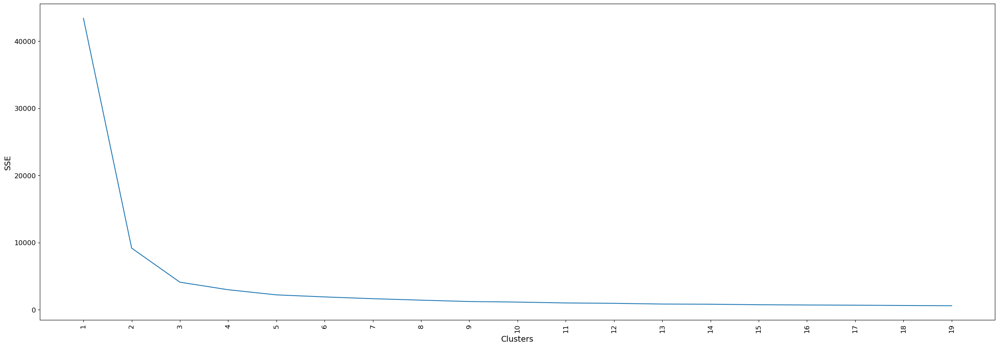

In [98]:
# testing the kmeans on user data

kmeansTrial(userData,20) #k = 5

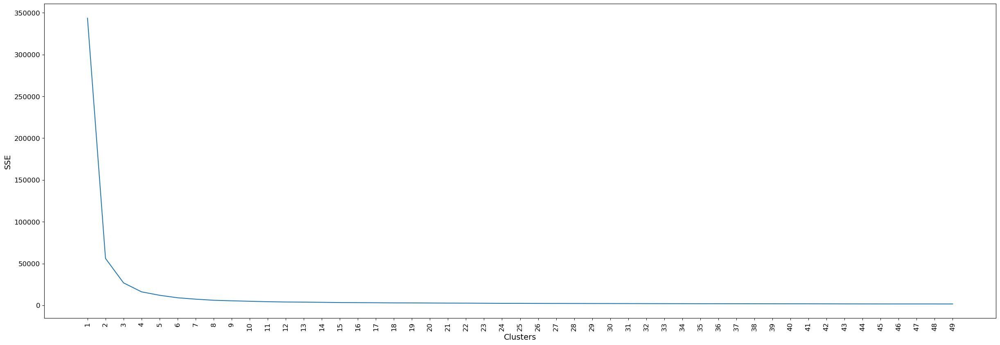

In [99]:
kmeansTrial(itemData,50) #k = 4

<h3>Visualising the clusters for both item and user based kmeans</h3>

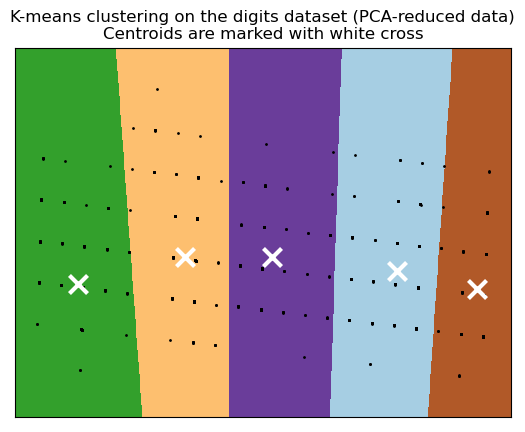

KMeans(n_clusters=5)

In [100]:
userKmeans = KMeans(n_clusters=5, init='k-means++', random_state=150)
userKmeans.fit(userData)
kmeansVisualize(userData,5)

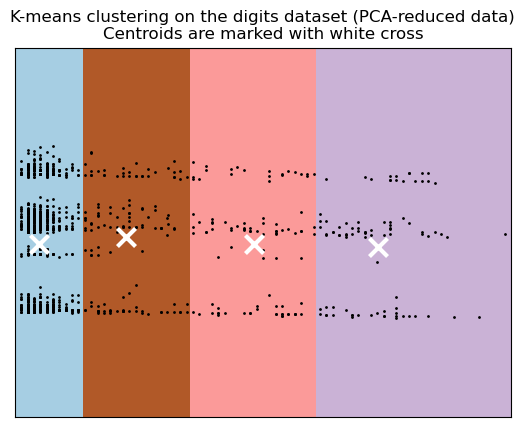

KMeans(n_clusters=4)

In [101]:
itemKmeans = KMeans(n_clusters=4, init='k-means++', random_state=150)
itemKmeans.fit(itemData)
kmeansVisualize(itemData,4)

<h3>Creating test data to test the Kmeans</h3>

In [102]:
# Getting the test items to be predicted

testData = pp.readRatingData('ml-100k\\ua.test')
testData

,user_id,item_id,rating
0,1,20,4
1,1,33,4
2,1,61,4
3,1,117,3
4,1,155,2
...,...,...,...
9425,943,232,4
9426,943,356,4
9427,943,570,1
9428,943,808,4


In [103]:
#specify

userTestData = pp.specifyByUserData(pp.readUserData(),testData,['gender','occupation','age_category'])
userTestX, userTestY = userTestData.drop('rating',axis='columns'),userTestData['rating']
userTestData

,user_id,gender,occupation,age_category,item_id,rating
0,1,1,19,2,20,4
1,1,1,19,2,33,4
2,1,1,19,2,61,4
3,1,1,19,2,117,3
4,1,1,19,2,155,2
...,...,...,...,...,...,...
9425,943,1,18,2,232,4
9426,943,1,18,2,356,4
9427,943,1,18,2,570,1
9428,943,1,18,2,808,4


In [104]:
itemTestData = pp.specifyByItemData(pp.readItemData(), testData, 'all').drop('year_category',axis='columns')
itemTestX, itemTestY = itemTestData.drop('rating', axis='columns'), itemTestData['rating']
itemTestData


,item_id,year,unknown,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,...,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,user_id,rating
0,1,1995.0,0,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,5,4
1,1,1995.0,0,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,17,4
2,1,1995.0,0,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,66,3
3,1,1995.0,0,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,67,3
4,1,1995.0,0,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,95,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9425,1646,1998.0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,828,4
9426,1653,1996.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,675,5
9427,1656,1998.0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,713,2
9428,1662,1997.0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,762,1


<h3>Adding cluster labels to the data</h3>

In [105]:
# testing the kmeans for one data only
# user
userDataClustered = userData.copy()
userDataClustered['cluster'] = userKmeans.labels_
print("All users' data with their cluster classification")
display(userDataClustered)

clusterArrU = []

for i in range(0,5):
  clusterArrU.append(userDataClustered.groupby(['cluster']).get_group(i))



All users' data with their cluster classification


,gender,occupation,age_category,cluster
0,1,19,2,1
1,0,13,5,3
2,1,20,2,1
3,1,19,2,1
4,0,13,3,3
...,...,...,...,...
938,0,18,2,1
939,1,0,3,4
940,1,18,1,1
941,0,10,4,2


<h3>Finding the distances of the training data from their clusters</h3>

In [106]:
testU = userTestX.loc[0].to_frame().transpose().drop(['user_id','item_id'],axis='columns')
display(testU)
print('below is the distance of testU to each cluster')
print(userKmeans.transform(testU))

,gender,occupation,age_category
0,1,19,2


below is the distance of testU to each cluster
[[15.12967015  0.83170767  9.53111931  5.62414786 18.68489087]]


In [107]:
#Get distance from clusters for each data. lets try just user for now

itemKmeans = KMeans(n_clusters=4, init='k-means++', random_state=150)
itemsTransform = itemKmeans.fit_transform(itemData)
itemsTransform


array([[ 1.62440708, 53.19381906, 33.61483151, 13.54006198],
       [ 1.62756561, 53.19723698, 33.61984146, 13.53623193],
       [ 1.05273492, 53.18035886, 33.59478425, 13.48908821],
       ...,
       [ 3.02405929, 56.18144813, 36.59708146, 16.48747956],
       [ 1.47305111, 52.17902422, 32.59074865, 12.47604893],
       [ 1.07855296, 54.17640064, 34.58732735, 14.4675864 ]])

In [108]:
itemsTransformDF = pd.DataFrame(data=itemsTransform,columns=range(1,5))
itemsTransformDF['item_id'] = pp.readItemData().dropna()['item_id']
itemsTransformDF=itemsTransformDF.set_index('item_id')
itemsTransformDF
# len(pp.readItemData()['item_id'].values.tolist())


,1,2,3,4
item_id,,,,
1.0,1.624407,53.193819,33.614832,13.540062
2.0,1.627566,53.197237,33.619841,13.536232
3.0,1.052735,53.180359,33.594784,13.489088
4.0,1.263096,53.191042,33.607315,13.505004
5.0,1.440568,53.191683,33.612013,13.532948
...,...,...,...,...
1677.0,2.904893,56.176189,36.586869,16.464776
1678.0,3.118890,56.185089,36.603696,16.503646
1679.0,3.024059,56.181448,36.597081,16.487480


<h3>Finding similarity based on cluster distances</h3>

,0,1,2,3,4,5,6,7,8,9,...,1671,1672,1673,1674,1675,1676,1677,1678,1679,1680
0,1.000000,0.999915,0.993777,0.996066,0.998006,0.990220,0.995284,0.996844,0.990220,0.981568,...,0.996889,0.388229,0.981019,0.981019,0.981019,0.942754,0.941762,0.942198,0.980519,0.981019
1,0.999915,1.000000,0.993743,0.996034,0.997971,0.990187,0.995251,0.996810,0.990187,0.981594,...,0.996857,0.388191,0.981037,0.981037,0.981037,0.942791,0.941799,0.942235,0.980488,0.981037
2,0.993777,0.993743,1.000000,0.997708,0.995766,0.996442,0.998491,0.996932,0.996442,0.980658,...,0.996886,0.384896,0.981439,0.981439,0.981439,0.940451,0.939255,0.939781,0.980579,0.981439
3,0.996066,0.996034,0.997708,1.000000,0.998053,0.994152,0.999213,0.999218,0.994152,0.981276,...,0.999176,0.386056,0.981576,0.981576,0.981576,0.941413,0.940288,0.940783,0.980740,0.981576
4,0.998006,0.997971,0.995766,0.998053,1.000000,0.992212,0.997270,0.998832,0.992212,0.981591,...,0.998871,0.387136,0.981470,0.981470,0.981470,0.942167,0.941105,0.941572,0.980661,0.981470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1676,0.942754,0.942791,0.940451,0.941413,0.942167,0.938985,0.941043,0.941682,0.938985,0.959587,...,0.941683,0.359841,0.957594,0.957594,0.957594,1.000000,0.997635,0.998680,0.923466,0.957594
1677,0.941762,0.941799,0.939255,0.940288,0.941105,0.937684,0.939894,0.940583,0.937684,0.958263,...,0.940585,0.360879,0.956115,0.956115,0.956115,0.997635,1.000000,0.998955,0.922569,0.956115
1678,0.942198,0.942235,0.939781,0.940783,0.941572,0.938256,0.940399,0.941066,0.938256,0.958849,...,0.941068,0.360413,0.956768,0.956768,0.956768,0.998680,0.998955,1.000000,0.922961,0.956768
1679,0.980519,0.980488,0.980579,0.980740,0.980661,0.979632,0.980770,0.980773,0.979632,0.962259,...,0.980793,0.398703,0.962318,0.962318,0.962318,0.923466,0.922569,0.922961,1.000000,0.962318


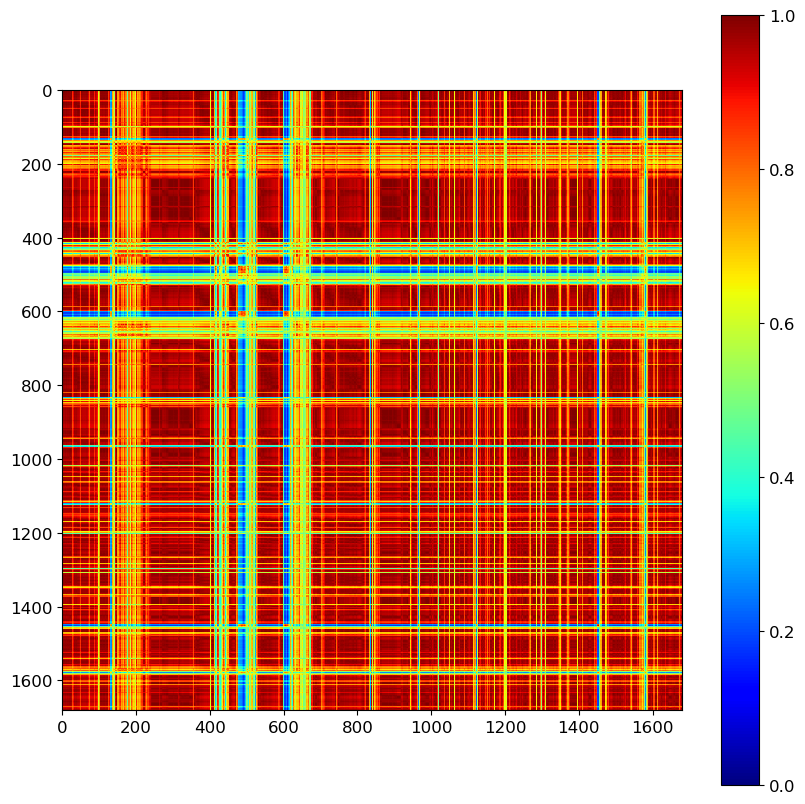

In [109]:
#now the whole thing for user
import sklearn.metrics as metrics

distance = metrics.pairwise_distances(itemsTransformDF.to_numpy(),metric='euclidean')
MAX = np.amax(distance)
distance = (MAX - distance)/MAX
display(pd.DataFrame(distance))
# distance = pd.DataFrame(distance)
plt.figure(figsize=(10, 10))
plt.imshow(distance)
plt.set_cmap('jet')  # Set the color of the box
plt.colorbar()  # Show the right side color
plt.show()


,1,2,3,4,5,6,7,8,9,10,...,934,935,936,937,938,939,940,941,942,943
1,1.000000,0.589447,0.923397,1.000000,0.572719,0.219641,0.036560,0.008394,0.929477,0.370386,...,0.168633,0.062546,0.583214,0.089355,0.979812,0.932703,0.008394,0.942929,0.402814,0.929477
2,0.589447,1.000000,0.539370,0.589447,0.948186,0.548791,0.254173,0.234133,0.640046,0.741369,...,0.450010,0.325463,0.955246,0.370501,0.600789,0.646377,0.234133,0.643907,0.792214,0.640046
3,0.923397,0.539370,1.000000,0.923397,0.517971,0.187985,0.030641,0.000000,0.853791,0.330212,...,0.148121,0.045722,0.528433,0.068282,0.926463,0.859217,0.000000,0.873204,0.357599,0.853791
4,1.000000,0.589447,0.923397,1.000000,0.572719,0.219641,0.036560,0.008394,0.929477,0.370386,...,0.168633,0.062546,0.583214,0.089355,0.979812,0.932703,0.008394,0.942929,0.402814,0.929477
5,0.572719,0.948186,0.517971,0.572719,1.000000,0.522617,0.216454,0.198277,0.628157,0.718455,...,0.416847,0.292803,0.986974,0.339821,0.582790,0.633169,0.198277,0.628527,0.777145,0.628157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,0.932703,0.646377,0.859217,0.932703,0.633169,0.261992,0.057263,0.030955,0.986208,0.420071,...,0.201730,0.092259,0.643572,0.122626,0.932331,1.000000,0.030955,0.981770,0.456484,0.986208
940,0.008394,0.234133,0.000000,0.008394,0.198277,0.598085,0.949652,1.000000,0.022153,0.422683,...,0.744031,0.858074,0.201719,0.784179,0.020964,0.030955,1.000000,0.039017,0.347511,0.022153
941,0.942929,0.643907,0.873204,0.942929,0.628527,0.264774,0.065942,0.039017,0.969619,0.420501,...,0.207365,0.098553,0.639065,0.127952,0.946399,0.981770,0.039017,1.000000,0.455159,0.969619
942,0.402814,0.792214,0.357599,0.402814,0.777145,0.711738,0.361686,0.347511,0.450227,0.921425,...,0.584450,0.457100,0.774124,0.511446,0.414166,0.456484,0.347511,0.455159,1.000000,0.450227


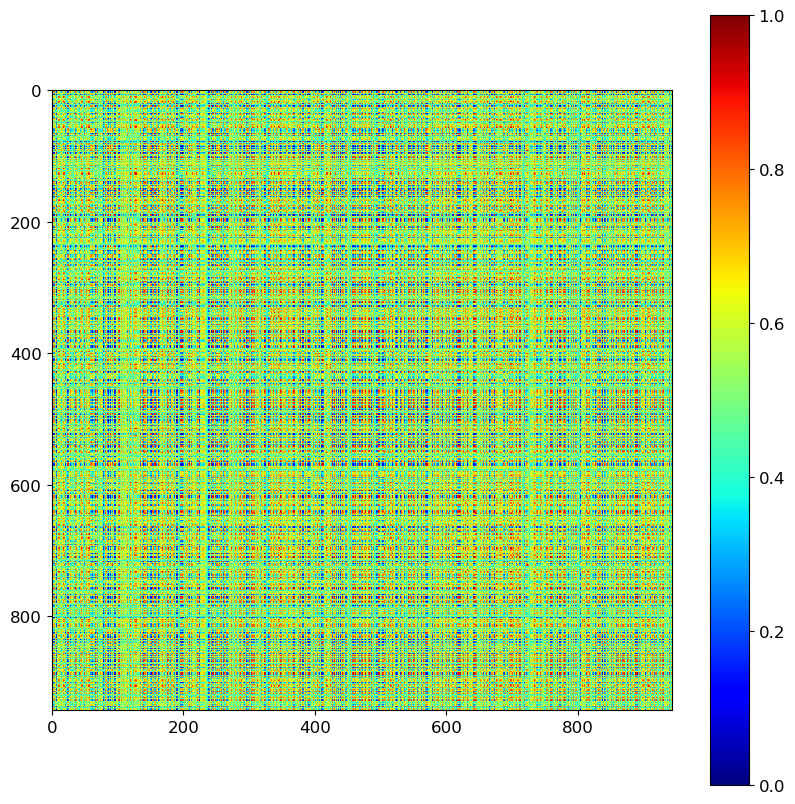

In [110]:
import sklearn.metrics as metrics

userKmeans = KMeans(n_clusters=5, init='k-means++', random_state=150)
usersTransform = userKmeans.fit_transform(userData)
usersTransformDF = pd.DataFrame(data=usersTransform, columns=range(1, 6))
usersTransformDF['user_id'] = pp.readUserData()['user_id']
usersTransformDF = usersTransformDF.set_index('user_id')

distance = metrics.pairwise_distances(usersTransformDF.to_numpy())
MAX = np.amax(distance)
distance = (MAX - distance)/MAX
sim = pd.DataFrame(distance)
sim.columns = pp.readUserData()['user_id'].values
sim.index = pp.readUserData()['user_id'].values
display(sim)

plt.figure(figsize=(10, 10))
plt.imshow(distance)
plt.set_cmap('jet')  # Set the color of the box
plt.colorbar()  # Show the right side color
plt.show()


<h2>Collaborative Filtering Method using Kmeans</h2>

In [111]:
from sklearn import neighbors
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, cross_val_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import preprocessingFuncts as pp
import sklearn.metrics as metrics

from models import KmeansCF

<h3>User Based</h3>

In [112]:
UBCF = KmeansCF('user')
UBCF.fit('ml-100k\\ua.base')
predY = UBCF.predict(testX)

print(classification_report(testY, predY))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.33      0.02      0.03       542
           2       0.22      0.14      0.17       995
           3       0.29      0.43      0.35      2424
           4       0.38      0.53      0.44      3316
           5       0.39      0.10      0.16      2153

    accuracy                           0.34      9430
   macro avg       0.27      0.20      0.19      9430
weighted avg       0.34      0.34      0.30      9430



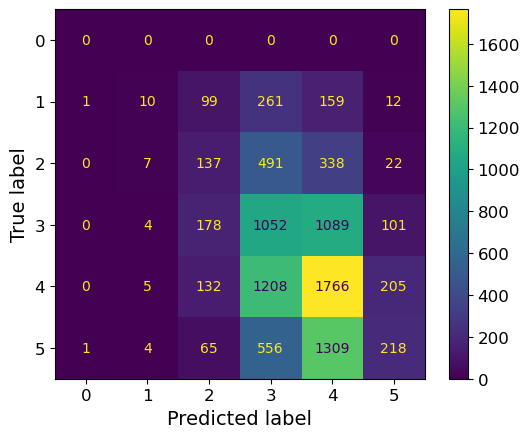

In [113]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(
    testY, predY, labels=[0, 1, 2, 3, 4, 5]
)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm, display_labels=[0, 1, 2, 3, 4, 5])
disp.plot()
plt.show()


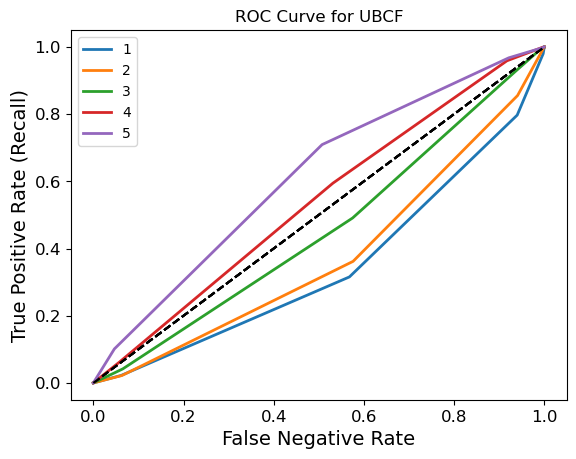

In [114]:
from sklearn.metrics import roc_curve
for i in range (1,6):
    fpr, tpr, thresholds = roc_curve(testY, predY, pos_label=i)
    plt.plot(fpr, tpr, linewidth=2,label = i)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.ylabel("True Positive Rate (Recall)")
    plt.xlabel("False Negative Rate")
    plt.title('ROC Curve for UBCF' )
plt.legend()

In [115]:
#Adding parameters to the model

UBCF = KmeansCF('user',k=10,threshold=3)
UBCF.fit('ml-100k\\ua.base')
predY = UBCF.predict(testX)

print(classification_report(testY, predY))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.39      0.02      0.03       542
           2       0.25      0.12      0.16       995
           3       0.30      0.44      0.35      2424
           4       0.38      0.59      0.47      3316
           5       0.45      0.05      0.09      2153

    accuracy                           0.35      9430
   macro avg       0.29      0.20      0.19      9430
weighted avg       0.36      0.35      0.30      9430



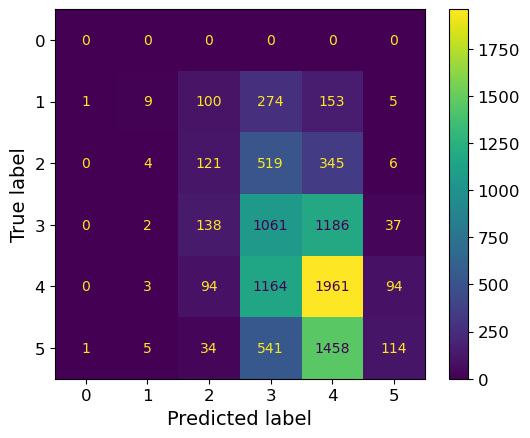

In [116]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(
    testY, predY, labels=[0, 1, 2, 3, 4, 5]
)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm, display_labels=[0, 1, 2, 3, 4, 5])
disp.plot()
plt.show()

<h2> Similarity Model </h2>

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.46      0.02      0.05       542
           2       0.20      0.12      0.15       995
           3       0.31      0.42      0.36      2424
           4       0.39      0.56      0.46      3316
           5       0.43      0.12      0.19      2153

    accuracy                           0.35      9430
   macro avg       0.30      0.21      0.20      9430
weighted avg       0.36      0.35      0.31      9430



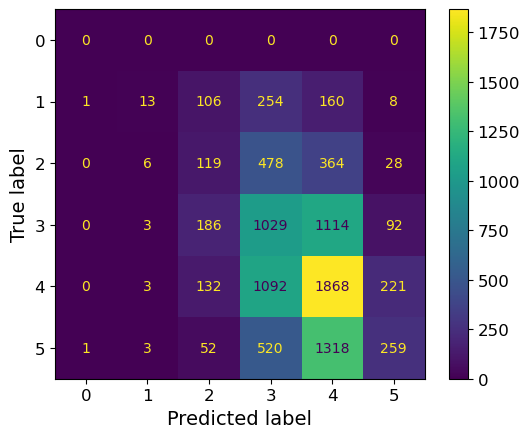

In [117]:
from simModel import simiModel
TEA = simiModel('user')
TEA.fit('ml-100k\\ua.base')

testData = pp.readRatingData('ml-100k\\ua.test')
testX, testY =  testData.loc[:,['user_id','item_id']],testData.loc[:,'rating']

predY = TEA.predict(testX)

from sklearn.metrics import classification_report

print(classification_report(testY, predY))


cm = confusion_matrix(
    testY, predY, labels=[0, 1, 2, 3, 4, 5]
)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm, display_labels=[0, 1, 2, 3, 4, 5])
disp.plot()
plt.show()


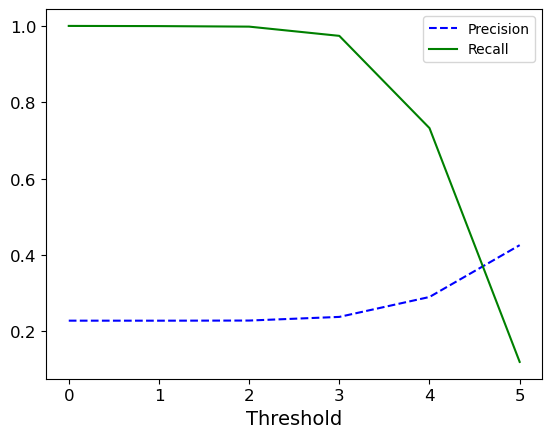

In [118]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve(
    testY, predY, pos_label=5)
plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
plt.legend()
plt.xlabel("Threshold")
plt.show()

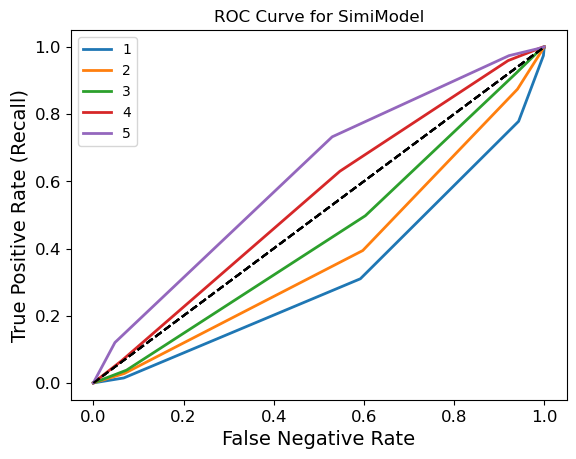

In [119]:
from sklearn.metrics import roc_curve
for i in range (1,6):
    fpr, tpr, thresholds = roc_curve(testY, predY, pos_label=i)
    plt.plot(fpr, tpr, linewidth=2,label = i)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.ylabel("True Positive Rate (Recall)")
    plt.xlabel("False Negative Rate")
    plt.title('ROC Curve for SimiModel' )
plt.legend()


              precision    recall  f1-score   support

           1       0.37      0.23      0.29       542
           2       0.31      0.13      0.19       995
           3       0.38      0.37      0.38      2424
           4       0.43      0.56      0.49      3316
           5       0.47      0.44      0.45      2153

    accuracy                           0.42      9430
   macro avg       0.39      0.35      0.36      9430
weighted avg       0.41      0.42      0.41      9430



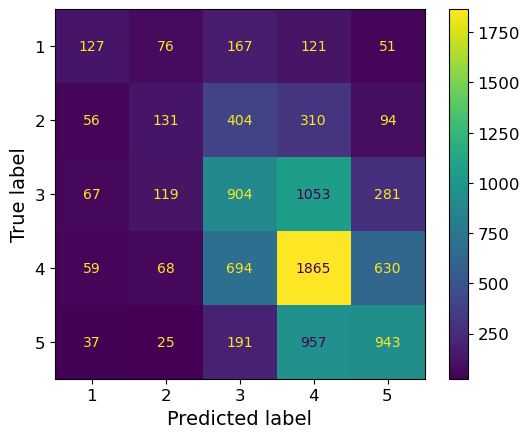

In [120]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.naive_bayes import CategoricalNB

ratingData = pp.readRatingData('ml-100k\\ua.base')
xTrain, yTrain = ratingData.drop(
    ['rating'], axis='columns'), ratingData.loc[:, 'rating']

model = CategoricalNB()
model.fit(xTrain, yTrain)

testData = pp.readRatingData('ml-100k\\ua.test')
testX, testY = testData.drop(
    ['rating'], axis='columns'), testData.loc[:, 'rating']

predY = model.predict(testX)
print(classification_report(testY, predY))


cm = confusion_matrix(
    testY, predY, labels=[1, 2, 3, 4, 5]
)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm, display_labels=[1, 2, 3, 4, 5])
disp.plot()
plt.show()


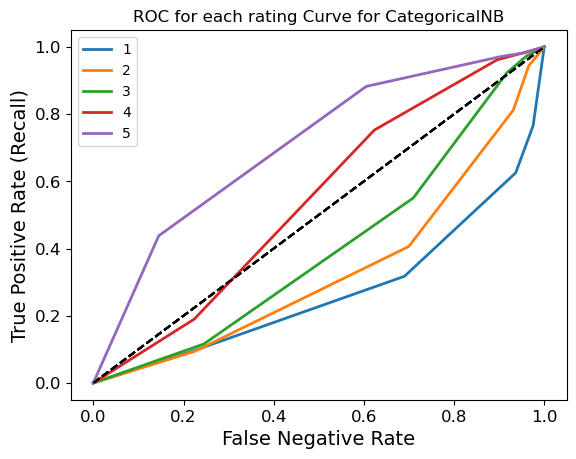

In [121]:
from sklearn.metrics import roc_curve
for i in range (1,6):
    fpr, tpr, thresholds = roc_curve(testY, predY, pos_label=i)
    plt.plot(fpr, tpr, linewidth=2,label = i)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.ylabel("True Positive Rate (Recall)")
    plt.xlabel("False Negative Rate")
    plt.title('ROC for each rating Curve for CategoricalNB' )
plt.legend()

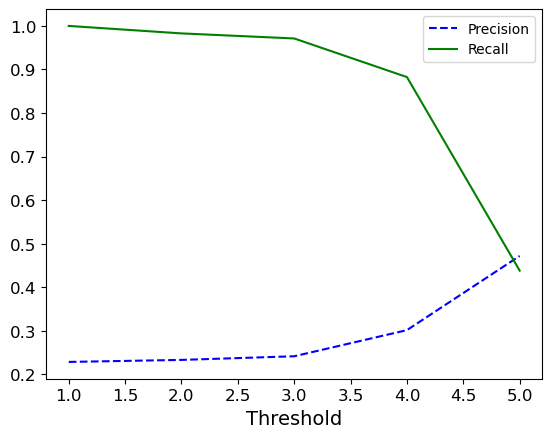

In [122]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve(
    testY, predY, pos_label=5)
plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
plt.legend()
plt.xlabel("Threshold")
plt.show()

<h2> Naive Bayes Method</h2>

In [123]:
from sklearn import neighbors
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, cross_val_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import preprocessingFuncts as pp
import sklearn.metrics as metrics

In [124]:
ratingData = pp.readRatingData('ml-100k\\ua.base')
xTrain, yTrain = ratingData.drop(
    ['rating'], axis='columns'), ratingData.loc[:, 'rating']
# ratingData = ratingData.pivot_table(
#     index='user_id', columns='item_id', values='rating')



              precision    recall  f1-score   support

           1       0.37      0.23      0.29       542
           2       0.31      0.13      0.19       995
           3       0.38      0.37      0.38      2424
           4       0.43      0.56      0.49      3316
           5       0.47      0.44      0.45      2153

    accuracy                           0.42      9430
   macro avg       0.39      0.35      0.36      9430
weighted avg       0.41      0.42      0.41      9430



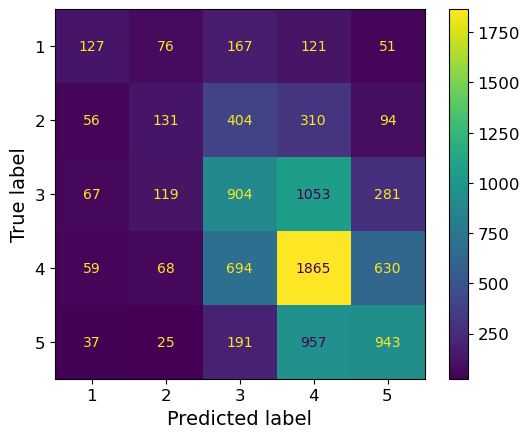

In [125]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.naive_bayes import CategoricalNB

model = CategoricalNB()
model.fit(xTrain, yTrain)

testData = pp.readRatingData('ml-100k\\ua.test')
testX, testY = testData.drop(['rating'], axis='columns'), testData.loc[:, 'rating']

predY = model.predict(testX)
print(classification_report(testY, predY))


cm = confusion_matrix(
    testY, predY, labels=[1, 2, 3, 4, 5]
)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm, display_labels=[1, 2, 3, 4, 5])
disp.plot()
plt.show()


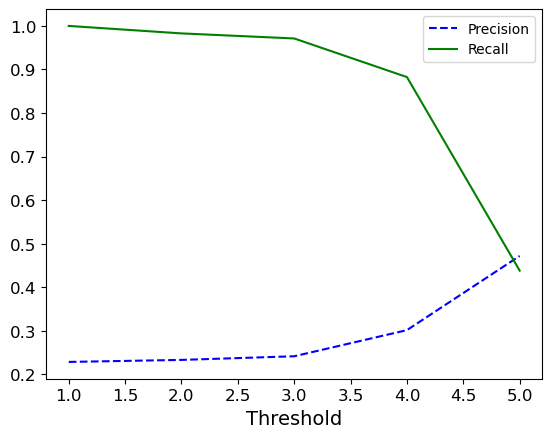

In [126]:
from sklearn.metrics import precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve(
    testY, predY, pos_label=5)
plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
plt.legend()
plt.xlabel("Threshold")
plt.show()

ROC

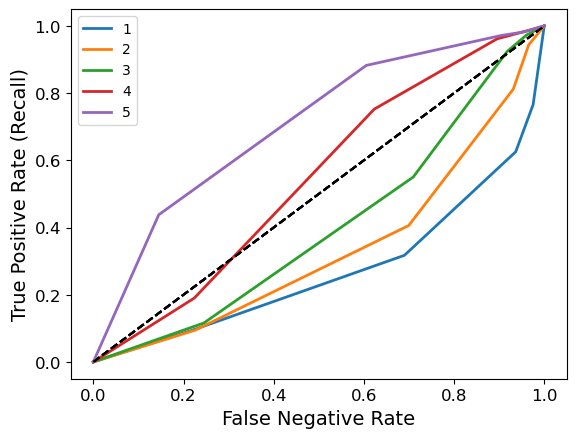

In [127]:
from sklearn.metrics import roc_curve
for i in range (1,6):
    fpr, tpr, thresholds = roc_curve(testY, predY, pos_label=i)
    plt.plot(fpr, tpr, linewidth=2,label = i)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.ylabel("True Positive Rate (Recall)")
    plt.xlabel("False Negative Rate")
plt.legend()

<h2> Cross Validation </h2>

In [128]:
import preprocessingFuncts as pp
import numpy as np
import pandas as pd
from models import KmeansCF
from models import CF
from simModel import simiModel
from sklearn.naive_bayes import CategoricalNB
from sklearn.metrics import classification_report

modelname = ["KmeansCF('user')","CF('user')","CF('item')","simiModel('user')","CategoricalNB()"]
dicpath=['ml-100k\\u1.base','ml-100k\\u2.base','ml-100k\\u3.base','ml-100k\\u4.base','ml-100k\\u5.base']
dicpathtest=['ml-100k\\u1.test','ml-100k\\u2.test','ml-100k\\u3.test','ml-100k\\u4.test','ml-100k\\u5.test']

for i in range(0,len(dicpath)):
    print(f'Split : {i+1}')
    index=0
    mydatatest=pp.readRatingData(dicpathtest[i])
    testX, testY = mydatatest.loc[:, ['user_id',
                                    'item_id']], mydatatest.loc[:, 'rating']
    model = [KmeansCF('user'),CF('user'),CF('item'),simiModel('user')]  
    for j in model:
        print(f'Model: {modelname[index]}')
        tempmodel = j
        tempmodel.fit(dicpath[i])
        predY = tempmodel.predict(testX)
        print(classification_report(testY,predY))
        index+=1
    
    # print("going here")
    print(f'Model: {modelname[index]}')
    tempmodel = CategoricalNB()
    # print(dicpath[i])
    ratingData = pp.readRatingData(dicpath[i])
    # print(ratingData)
    xTrain, yTrain = ratingData.loc[:,['user_id','item_id']], ratingData.loc[:, 'rating']
    tempmodel.fit(xTrain, yTrain)
    # print(testX.index.values)
    predY = tempmodel.predict(testX)
    print(classification_report(testY, predY))
    del tempmodel

Split : 1
Model: KmeansCF('user')
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.39      0.02      0.04      1391
           2       0.22      0.14      0.17      2192
           3       0.31      0.44      0.36      5182
           4       0.38      0.56      0.45      6778
           5       0.43      0.11      0.18      4457

    accuracy                           0.34     20000
   macro avg       0.29      0.21      0.20     20000
weighted avg       0.35      0.34      0.31     20000

Model: CF('user')
[3, 4, 5, 4, 3, 4, 4, 3, 3, 4, 4, 2, 4, 3, 4, 3, 3, 3, 3, 4, 4, 4, 3, 4, 4, 3, 4, 4, 3, 3, 3, 4, 2, 2, 4, 4, 3, 3, 4, 3, 3, 4, 4, 3, 5, 5, 3, 2, 2, 4, 4, 3, 4, 5, 4, 3, 2, 3, 4, 4, 4, 3, 4, 4, 3, 4, 2, 2, 4, 4, 4, 2, 4, 3, 3, 3, 3, 3, 5, 4, 4, 4, 4, 5, 4, 4, 4, 3, 4, 4, 5, 4, 4, 4, 3, 4, 4, 4, 4, 3, 3, 3, 3, 4, 3, 3, 4, 3, 4, 2, 3, 2, 2, 3, 4, 3, 3, 3, 4, 4, 4, 2, 4, 3, 2, 3, 2, 3, 5, 3, 3, 4, 3, 4, 2,

----------------------------------------------------------------------------------------

# Model Comparison & Analysis

<ol>
    <li> For Item and User based CF, it's problem is that it has some missing matrices because the data is too sparse. This leads to some items not being able to be predicted, due to no prior data regarding it.
    <li> For KMeans CF and Similarity CF, we try to fix that by finding similarities between the items and users through their details (eg: occupation, genre, age, etc). This only increased the similarity by 1 percent which isn't very good.
    <li> Categorical Naive Bayes probably worked the best because on the first two, we lacked data and stable connections between the data. Connections meaning how the attributes of the data can correlate to the end classification. Categorical NB creates their own categories and probability through the patterns they find within the data, not trying to implement inconsistent parameters such as if certain people from certain occupations prefer watching certain movies or not. Therefore, categorical naive bayes is the best method out of the 5.
</ol>